# 1) BTC model backtests

## a) Load data

In [1]:
model_config = {
                "model_name": "BTCUSD_1h_test",
                "account": "test",
                "reporting_currency": "USD",
                "instrument_type": "spot",
                "order_type": "market",
                "run_mode": "paper",
                "model_instruments": {"timeframes": ["1h"],
                                      "instruments": ["ccxt_currencycom__US500"],
                                      "instrument_to_trade": "polygon_io__C:AUDUSD", 
                                      "spot_instrument": "polygon_io__C:AUDUSD",
                                      "futures_instruments": [],
                                      "factor_instruments": [],
                                      "timeframe_to_trade": "3h",
                                      "kline_to_trade": "3h_close",
                                      "volume_to_trade": "3h_volume",
                                      "tradable_times" : [["00:05", "23:50"]],
                                      "closing_session_times":  [["23:50", "00:00"]],
                                      "futures_trading_window": []
                                      },
                "signals": {"runtime_window": ["2023-01-01","2023-12-31"],
                            "signal_function": "default",
                            "target_signal" : "sig_close_US500",
                            "univariate": {"z_apply_to": ["close_US500"],
                                            "z_window": [288,288],
                                            "z_threshold": 2
                                            },
                            "composite": {"factors": [],
                                          "factors_to_normalise": [],
                                          "factor_loadings": {},
                                          "scaler_path": "./database/scalers/",
                                          "scaler_name": "spread_scaler"
                                          },
                            "thresholds": {"normalize_thresholds": False,
                                            "L_threshold_lookback": 288,
                                            "L_threshold_upper": 0.95,
                                            "L_threshold_lower": 0.05,
                                            "S_threshold_lookback": 288,
                                            "S_threshold_upper": 0.95,
                                            "S_threshold_lower": 0.05
                                            },
                            "position_sizing":{"position_size_ATR_window": 14,
                                                "position_size_norm_window": 288,
                                                "position_size_range": [1,2],
                                                "max_holding_period": 10000
                                                } 
                            },
                "equity_settings": {"starting_equity": 100000,
                                    "long_allocation": 50000,
                                    "short_allocation": 50000,
                                    "long_trade_notional": 50000,
                                    "short_trade_notional": 50000,
                                    "fee": 0,
                                    "slippage": 0
                                    },
                "telegram_settings":{"telegram_auth_token": "1630147885:AAGnIa_atPCj6GPnYZwfH1ipEmw6X4L32iU",
                                      "chat_id": -1001202892045,
                                      "output_path":"./telegram_manager/"
                                      }
}






In [2]:
from klines_managers import klines_MR

klines_manager_mr = klines_MR.KlinesManagerMR(model_config)
instruments_dict = klines_manager_mr.load_and_update(limit_ccxt=1000, limit_TV=1000)

CCXT LOADING: ['ccxt_currencycom__US500']

Getting <<US500>> from <<currencycom>> 
US500 (1h)
available till is outdated (2023-04-14 06:00:00)
--> in database (25773 rows): 2018-11-29 23:00:00 ===> 2023-04-14 06:00:00 (0.0s)
US500 fetched: 2023-03-15T10:00:00.000Z to 2023-04-26T01:00:00.000Z
---> 679 | 2023-04-26T01:00:00.000Z to 2023-03-15T10:00:00.000Z
--> queried     (679 rows): 2023-03-15 10:00:00 ===> 2023-04-26 01:00:00 (2.24s)
--> updated     (25954 rows): 2018-11-29 23:00:00 ===> 2023-04-26 01:00:00 (0.0s)


In [7]:
instruments_dict

{'ccxt_currencycom__US500': {'1h':                        open    high     low   close  volume    close_time
  datetime                                                                 
  2018-11-29 23:00:00  2740.4  2741.5  2738.3  2740.8  2944.0  1.543532e+09
  2018-11-30 00:00:00  2740.9  2742.3  2738.8  2740.7  4462.0  1.543536e+09
  2018-11-30 01:00:00  2740.4  2741.2  2738.1  2740.1  6042.0  1.543540e+09
  2018-11-30 02:00:00  2740.2  2742.3  2738.7  2741.5  4942.0  1.543543e+09
  2018-11-30 03:00:00  2741.4  2743.7  2741.3  2742.3  2939.0  1.543547e+09
  ...                     ...     ...     ...     ...     ...           ...
  2023-04-25 05:00:00  4123.2  4125.7  4121.5  4124.7   319.0  1.682399e+09
  2023-04-25 06:00:00  4124.6  4127.5  4122.2  4125.7   603.0  1.682402e+09
  2023-04-25 07:00:00  4126.0  4126.5  4113.2  4116.2  1727.0  1.682406e+09
  2023-04-25 08:00:00  4116.5  4118.2  4108.7  4115.0  1175.0  1.682410e+09
  2023-04-25 09:00:00  4114.7  4116.2  4112.6  4114.5  

In [13]:
from utils import pickle_helper
audusd_df = pickle_helper.pickle_this(data=None, pickle_name="polygon_io__C;AUDUSD_1h", path="./database/polygon/")

In [15]:
temp = {}
temp["1h"] = audusd_df

instruments_dict["polygon_io__AUDUSD"]=temp

In [16]:
# Resample from 1hr --> 2h, 3h, 4h, 6h, 12h, 24h, 
from signals import resampler

resample_to_list = ["2h", "3h", "4h", "6h", "12h", "24h"]
first_timeframe = "1h"

# resample_to_list = ["15m", "20m", "30m", "60m"]
# first_timeframe = "5m"
for instrument,instrument_dict in instruments_dict.items():
    print(f"\n{instrument}\n")
    for resample_to in resample_to_list:
        df = instrument_dict[first_timeframe].copy()
        window = int(int(resample_to[:-1])/int(first_timeframe[:-1]))
        print(f"Resampling {first_timeframe} to {resample_to} --> window: {window}")
        if "m" in resample_to:
            resample_to_formatted = resample_to[:-1]+"T"
        else:
            resample_to_formatted = resample_to
        df_resampled = resampler.calc_klines_resample(df,window=window, resample_to=resample_to_formatted)
        # print(df_resampled.columns)
        instruments_dict[instrument][resample_to] = df_resampled
        
    



ccxt_currencycom__US500

Resampling 1h to 2h --> window: 2
Resampling 1h to 3h --> window: 3
Resampling 1h to 4h --> window: 4
Resampling 1h to 6h --> window: 6
Resampling 1h to 12h --> window: 12
Resampling 1h to 24h --> window: 24

polygon_io__AUDUSD

Resampling 1h to 2h --> window: 2
Resampling 1h to 3h --> window: 3
Resampling 1h to 4h --> window: 4
Resampling 1h to 6h --> window: 6
Resampling 1h to 12h --> window: 12
Resampling 1h to 24h --> window: 24


## b) Calculate Signals

In [20]:
instruments=['polygon_io__AUDUSD','ccxt_currencycom__US500']

In [80]:
import importlib
from signals import signals
importlib.reload(signals)
from signals import composite_signals
importlib.reload(composite_signals)

from signals import signal_thresholds
target_signal = "sig_close"
z_apply_to = ["open","high","low","close","volume"]    
first_timeframe = "1h"    
df_sigs_dict={} 
if first_timeframe == "1h":
    lookback_bars_x = 288
elif first_timeframe == "5m":
    lookback_bars_x = 288*12*5
    
    
for timeframe in list(instruments_dict[list(instruments_dict.keys())[0]].keys())[0:3]:
# timeframe = "1h"

    # print(f"Populating signals for {timeframe} ...")
    
    lookback_bars = lookback_bars_x#/int(timeframe[:-1])
    print(f"\n\n{'='*40}\nPopulating signals for {timeframe}\nlookack: {lookback_bars}\n{'='*40}")

    instruments = list(instruments_dict.keys())    
    futures_trading_times = []
    z_lookback_windows = [lookback_bars]*len(z_apply_to)

    factors_to_compose = [] 
    factors_to_normalise = [] 
    temp = {}
    
    sig_dict0 = signals.merge_instruments_dict(instruments_dict = instruments_dict, 
                                              spot_instrument = instruments[0],
                                              futures_instruments = instruments[1], 
                                              futures_trading_times = futures_trading_times, #["02:30:00","10:00:00"],
                                              verbose = False)

    sig_dict0 = signals.populate_z_signals(sig_dict0,
                                          lookback_windows = z_lookback_windows, 
                                          sig_threshold = 2,
                                          columns = z_apply_to,
                                           verbose = False,
                                         )

    # sig_dict0 = composite_signals.calc_rolling_composite_signal(sig_dict0, 
    #                                                            factors_to_compose = factors_to_compose,
    #                                                            factors_to_normalise = factors_to_normalise,
    #                                                            test_factor_loadings =  None,#[-0.02178511, 0.99976268],
    #                                                            rolling_start_date = rolling_start_date,
    #                                                            rolling_window_period = rolling_window_period, 
    #                                                            min_period = min_period,
    #                                                            verbose=True)

    # fit window: 2020-01-02 06:00:00 --> 2020-12-31 21:55:00 
    # ===> 
    # sig0 pcs: [-0.02178511, 0.99976268] 
    # VS 
    # sig  pcs:[-0.02158948, 0.99976692]

    from signals import composite_signals
    importlib.reload(composite_signals)


    normalize=False



    # sig_dict = signal_thresholds.calc_signal_thresholds(sig_dict0,
    #                                                     normalize = normalize,
    #                                                     target_signal = target_signal,
    #                                                     threshold_func = "qtl",
    #                                                     L_q_lookback = L_q_lookback,
    #                                                     L_q_lower = L_q_lower,
    #                                                     S_q_lookback = S_q_lookback,
    #                                                     S_q_upper = S_q_upper,
    #                                                     S_q_lower = S_q_lower
    #                                                    )

    
    from signals import composite_signals
    importlib.reload(composite_signals) 

    df_sig = composite_signals.merge_signals(sig_dict0, smallest_timeframe = timeframe, target_signal = target_signal)
    # print(df_sig.columns)
    # %matplotlib widget

    # Select eigen vector with suitable signs [- and + ] but does doesnt tally for 2020-2021 where 0.05, 0.99
    # df_sig.filter(regex="weight").plot()


    import importlib
    from signals import position_sizing
    importlib.reload(position_sizing)

    instrument_atr = ""
    position_sizing_range = (1,2)

    df_sig = position_sizing.calc_position_sizes(df_sig,
                                                    high = f"{timeframe}_high{instrument_atr}",
                                                    low = f"{timeframe}_low{instrument_atr}",
                                                    close = f"{timeframe}_close{instrument_atr}",
                                                    window_ATR = 14,
                                                    window_norm=14,
                                                   newRange=position_sizing_range)

    df_sig.index.name = "date_time"

    df_sigs_dict[timeframe] = df_sig



Populating signals for 1h
lookack: 288


Populating signals for 2h
lookack: 288


Populating signals for 3h
lookack: 288


## c) Backtest

In [81]:
# ============================
# Backtest parameters
# ============================
fee = 0.000
# fee = 0
slippage = 0.0

min_holding_period = 0
max_holding_period = 1e6

long_equity = 5e5
long_notional=5e5
short_equity = 5e5
short_notional= 5e5

signal_function="default"
figsize = (20,15) #(20,29) # width, height
# figsize = (20,30)
# window =["2020-11-02","2022-08-23"] # - 0th backtest
window =["2021-01-01","2023-03-29"] 
model_name= "Momentum"
# window =["2022-06-01","2023-12-31"] 
# model_name = "Mean_Reversion"

tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|█████████████████████████████████████| 6544/6544 [00:00<00:00, 307949.35it/s]


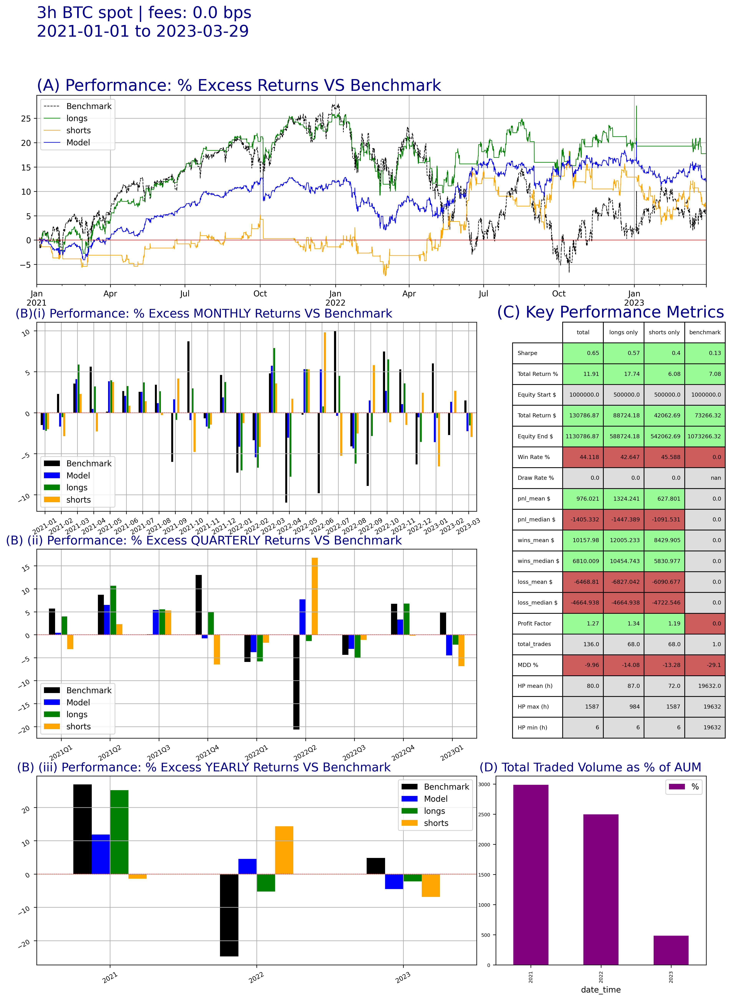

In [83]:
# %matplotlib widget
import importlib
from performance import metrics
importlib.reload(metrics)
from performance import backtest_plot
importlib.reload(backtest_plot)
from backtester import backtest
importlib.reload(backtest)


tradable_times = [["00:05", "23:50"]]
closing_session_times= [["23:50", "00:00"]]



timeframe = "3h"
sig_timeframe = f"3h"
kline_to_trade = f"{timeframe}_close"
volume_to_trade= f"{timeframe}_volume"



title = f"{timeframe} BTC spot | fees: {fee*1e4} bps"
file_name = f"{timeframe} BTC Model"
# signal = "ES_USD_close_sig" 
# window = ["2021-01-01","2021-12-31"] 
df_sig = df_sigs_dict[timeframe].copy()
df_trade = df_sig[window[0]:window[1]].copy()




signals = [f"{sig_timeframe}_{target_signal}"]
df_trade[["sig"]] = df_trade[signals]
signals = ["sig"]
df_backtested,df_trades,df_summary = backtest.backtest(model_name= model_name,
                                                       df0=df_trade,
                                                       kline_to_trade=kline_to_trade,
                                                       volume_to_trade = volume_to_trade,
                                                       tradable_times = tradable_times,
                                                       closing_session_times = closing_session_times,
                                                       position_sizing_to_trade=None,
                                                       min_holding_period=min_holding_period/int(timeframe[:-1]),
                                                       max_holding_period=max_holding_period/int(timeframe[:-1]),
                                                       fee=fee,
                                                       slippage=slippage,
                                                       long_equity = long_equity,
                                                       short_equity = short_equity,
                                                       long_notional=long_notional,
                                                       short_notional=short_notional,
                                                       signals=signals, 
                                                       signal_function=signal_function, 
                                                       figsize=figsize, # width, height
                                                       show_B=True,
                                                       show_LS=True,
                                                       title=title,
                                                       file_name=file_name,
                                                       plots="ppt",
                                                       diagnostics_verbose=False,
                                                       trail_SL = None,
                                                       trail_TP = None,
                                                       trail_increment = None,
                                                       N=365*8
                                                       )

## d) plotly

CONVERTING TIMEZONE: UTC ----> Asia/Singapore
initially: 2023-03-29 03:00:00
now: 2023-03-29 11:00:00+08:00
now: 2023-03-29 11:00:00
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl']
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl'] --> LIST DETECTED
cum_A_pnl -> line plot
cum_S_pnl -> line plot
cum_L_pnl -> line plot
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}]
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}] --> LIST DETECTED
yaxis:  y   2
plotting: [{'instrument': 'BTC-USDT', 'open': '3h_open', 'high': '3h_high', 'low': '3h_low', 'close': '3h_close', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 0.25}, 'L_entry_price', 'L_exit_pr

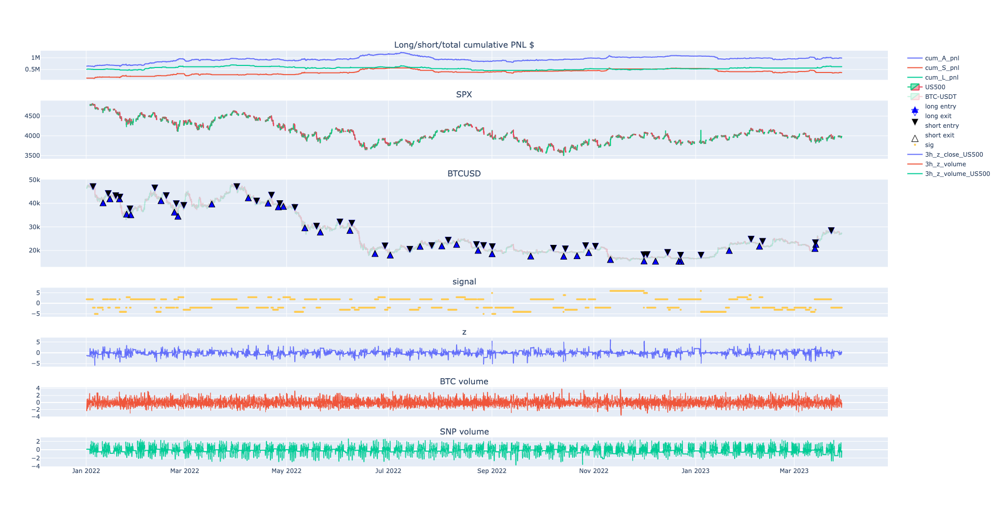

In [32]:

import importlib
from performance import plotly_studies
importlib.reload(plotly_studies)


# window = ["2022-01-01","2022-12-31"] 
window = ["2022-01-01","2023-03-31"]

timeframe = "3h"

ohlc = {"instrument":instruments[0].split("__")[1],
        "open":f"{timeframe}_open",
        "high":f"{timeframe}_high",
        "low":f"{timeframe}_low",
        "close":f"{timeframe}_close",
        "up_color":'rgb(14,203,129)',
        "down_color":'rgb(233,67,89)',
        "opacity":0.25}


symbol_factor = instruments[1].split("__")[-1]
ohlc_factor = {"instrument": symbol_factor,
                "open":f"{timeframe}_open_{symbol_factor}",
                "high":f"{timeframe}_high_{symbol_factor}",
                "low":f"{timeframe}_low_{symbol_factor}",
                "close":f"{timeframe}_close_{symbol_factor}",
                "up_color":'rgb(14,203,129)',
                "down_color":'rgb(233,67,89)',
                "opacity":1}


cols_to_plot = [["cum_A_pnl", "cum_S_pnl","cum_L_pnl"],
                [ohlc_factor],
                [ohlc,'L_entry_price','L_exit_price','S_entry_price','S_exit_price',],
                ['sig__scatter'],["3h_z_close_US500"],["3h_z_volume"],["3h_z_volume_US500"],
                ]


subplot_titles = ["Long/short/total cumulative PNL $",f"SPX",f"BTCUSD", "signal","z","BTC volume","SNP volume"]
# subplot_titles = ["Long/short/total cumulative PNL $", f"{instruments[0]}", "signal", 'size']#"ES1!"]
row_heights = [1,2,3,1,1,1,1]
ps = plotly_studies.build(cols_to_plot = cols_to_plot,
                          row_heights = row_heights,
                          height=1000,
                          width=1500,
                         resampler=False, 
                         publish=True,
                         output_path= "./telegram/",
                         output_name = "BTC model",
                         subplot_titles = subplot_titles,
                         verbose=True)
ps.plot(df_backtested[window[0]:window[1]])

# 2) Catboosted

## a) Load data

In [141]:
from config.load_config import load_config_file
from main import Trading_Bot

import importlib
importlib.reload(Trading_Bot)


# Load model name from config-dev
MODEL_NAME = load_config_file('./config/config-dev.json')['model_name']
# Load model config from given model name in config-dev.json
model_config = load_config_file(f'./config/{MODEL_NAME}.json')

# bot = Trading_Bot.Trading_Bot(model_config)    





In [142]:
from data_manager import klines_MR

klines_manager_mr = klines_MR.KlinesManagerMR(model_config)
instruments_dict = klines_manager_mr.load_and_update(limit_ccxt=1000, limit_TV=1000)

CCXT LOADING: ['ccxt_kucoin__BTC-USDT', 'ccxt_currencycom__US500']

Getting <<BTC-USDT>> from <<kucoin>> 
BTC-USDT (1h)
available till is outdated (2023-04-12 06:00:00)
--> in database (38367 rows): 2018-11-25 16:00:00 ===> 2023-04-12 06:00:00 (0.0s)
BTC-USDT fetched: 2023-03-01T15:00:00.000Z to 2023-04-12T06:00:00.000Z
---> 1000 | 2023-04-12T06:00:00.000Z to 2023-03-01T15:00:00.000Z
--> queried     (1000 rows): 2023-03-01 15:00:00 ===> 2023-04-12 06:00:00 (0.98s)
--> updated     (38367 rows): 2018-11-25 16:00:00 ===> 2023-04-12 06:00:00 (0.01s)

Getting <<US500>> from <<currencycom>> 
US500 (1h)
available till is outdated (2023-04-12 06:00:00)
--> in database (25727 rows): 2018-11-29 23:00:00 ===> 2023-04-12 06:00:00 (0.0s)
US500 fetched: 2023-03-01T15:00:00.000Z to 2023-04-12T06:00:00.000Z
---> 678 | 2023-04-12T06:00:00.000Z to 2023-03-01T15:00:00.000Z
--> queried     (678 rows): 2023-03-01 15:00:00 ===> 2023-04-12 06:00:00 (2.58s)
--> updated     (25727 rows): 2018-11-29 23:00:00 ==

In [143]:
# Resample from 1hr --> 2h, 3h, 4h, 6h, 12h, 24h, 
from signals import resampler

resample_to_list = ["2h", "3h", "4h", "6h", "12h", "24h"]
first_timeframe = "1h"

# resample_to_list = ["15m", "20m", "30m", "60m"]
# first_timeframe = "5m"
for instrument,instrument_dict in instruments_dict.items():
    print(f"\n{instrument}\n")
    for resample_to in resample_to_list:
        df = instrument_dict[first_timeframe].copy()
        window = int(int(resample_to[:-1])/int(first_timeframe[:-1]))
        print(f"Resampling {first_timeframe} to {resample_to} --> window: {window}")
        if "m" in resample_to:
            resample_to_formatted = resample_to[:-1]+"T"
        else:
            resample_to_formatted = resample_to
        df_resampled = resampler.calc_klines_resample(df,window=window, resample_to=resample_to_formatted)
        # print(df_resampled.columns)
        instruments_dict[instrument][resample_to] = df_resampled
        
    



ccxt_kucoin__BTC-USDT

Resampling 1h to 2h --> window: 2
Resampling 1h to 3h --> window: 3
Resampling 1h to 4h --> window: 4
Resampling 1h to 6h --> window: 6
Resampling 1h to 12h --> window: 12
Resampling 1h to 24h --> window: 24

ccxt_currencycom__US500

Resampling 1h to 2h --> window: 2
Resampling 1h to 3h --> window: 3
Resampling 1h to 4h --> window: 4
Resampling 1h to 6h --> window: 6
Resampling 1h to 12h --> window: 12
Resampling 1h to 24h --> window: 24


## b) Calculate Signals

In [144]:
import importlib
from signals import signals
importlib.reload(signals)
from signals import composite_signals
importlib.reload(composite_signals)

from signals import signal_thresholds
target_signal = "sig_close_US500"
# z_apply_to =["open","high","low","close","volume", "open_US500","high_US500","low_US500","close_US500", "volume_US500"]       
z_apply_to =["open_US500","high_US500","low_US500","close_US500", "volume_US500"]       
    
df_sigs_dict={} 
if first_timeframe == "1h":
    lookback_bars_x = 288
elif first_timeframe == "5m":
    lookback_bars_x = 288*12*5
for timeframe in list(instruments_dict[list(instruments_dict.keys())[0]].keys())[2:3]:
# timeframe = "1h"

    # print(f"Populating signals for {timeframe} ...")
    
    lookback_bars = lookback_bars_x/int(timeframe[:-1])
    print(f"\n\n{'='*40}\nPopulating signals for {timeframe}\nlookack: {lookback_bars}\n{'='*40}")

    instruments = list(instruments_dict.keys())    
    futures_trading_times = []
    z_lookback_windows = [lookback_bars]*len(z_apply_to)

    factors_to_compose = [] 
    factors_to_normalise = [] 
    temp = {}
    
    sig_dict0 = signals.merge_instruments_dict(instruments_dict = instruments_dict, 
                                              spot_instrument = instruments[0],
                                              futures_instruments = instruments[1], 
                                              futures_trading_times = futures_trading_times, #["02:30:00","10:00:00"],
                                              verbose = False)

    sig_dict0 = signals.populate_z_signals(sig_dict0,
                                          lookback_windows = z_lookback_windows, 
                                          sig_threshold = 2,
                                          columns = z_apply_to,
                                           verbose = True,
                                         )

    # sig_dict0 = composite_signals.calc_rolling_composite_signal(sig_dict0, 
    #                                                            factors_to_compose = factors_to_compose,
    #                                                            factors_to_normalise = factors_to_normalise,
    #                                                            test_factor_loadings =  None,#[-0.02178511, 0.99976268],
    #                                                            rolling_start_date = rolling_start_date,
    #                                                            rolling_window_period = rolling_window_period, 
    #                                                            min_period = min_period,
    #                                                            verbose=True)

    # fit window: 2020-01-02 06:00:00 --> 2020-12-31 21:55:00 
    # ===> 
    # sig0 pcs: [-0.02178511, 0.99976268] 
    # VS 
    # sig  pcs:[-0.02158948, 0.99976692]

    from signals import composite_signals
    importlib.reload(composite_signals)


    normalize=False



    # sig_dict = signal_thresholds.calc_signal_thresholds(sig_dict0,
    #                                                     normalize = normalize,
    #                                                     target_signal = target_signal,
    #                                                     threshold_func = "qtl",
    #                                                     L_q_lookback = L_q_lookback,
    #                                                     L_q_lower = L_q_lower,
    #                                                     S_q_lookback = S_q_lookback,
    #                                                     S_q_upper = S_q_upper,
    #                                                     S_q_lower = S_q_lower
    #                                                    )

    
    from signals import composite_signals
    importlib.reload(composite_signals) 

    df_sig = composite_signals.merge_signals(sig_dict0, smallest_timeframe = timeframe, target_signal = target_signal)
    # print(df_sig.columns)
    # %matplotlib widget

    # Select eigen vector with suitable signs [- and + ] but does doesnt tally for 2020-2021 where 0.05, 0.99
    # df_sig.filter(regex="weight").plot()


    import importlib
    from signals import position_sizing
    importlib.reload(position_sizing)

    instrument_atr = ""
    position_sizing_range = (1,2)

    df_sig = position_sizing.calc_position_sizes(df_sig,
                                                    high = f"{timeframe}_high{instrument_atr}",
                                                    low = f"{timeframe}_low{instrument_atr}",
                                                    close = f"{timeframe}_close{instrument_atr}",
                                                    window_ATR = 14,
                                                    window_norm=14,
                                                   newRange=position_sizing_range)

    df_sig.index.name = "date_time"

    df_sigs_dict[timeframe] = df_sig



Populating signals for 3h
lookack: 96.0

---------------> 1h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score signal for high_US500 --> 96.0  
Calculating z-score signal for low_US500 --> 96.0  
Calculating z-score signal for close_US500 --> 96.0  
Calculating z-score signal for volume_US500 --> 96.0  

---------------> 2h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score signal for high_US500 --> 96.0  
Calculating z-score signal for low_US500 --> 96.0  
Calculating z-score signal for close_US500 --> 96.0  
Calculating z-score signal for volume_US500 --> 96.0  

---------------> 3h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score signal for high_US500 --> 96.0  
Calculating z-score signal for low_US500 --> 96.0  
Calculating z-score signal for close_US500 --> 96.0  
Calculating z-score signal for volume_US500 --> 96.0  

---------------> 4h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score 

## c) Label

### i) Triple Barrier (WIP)

In [13]:
from labels import triple_barrier
import importlib
importlib.reload(triple_barrier)
number_of_labels=3
df_labelled = triple_barrier.calc_triple_barrier(df,
                                                 col_series="3h_close",
                                                 col_timestamps = "3h_close_time",
                                                 labels=number_of_labels,
                                                 horizon_delta = 40,
                                                 vol_span = 3,
                                                 upper_z = 1,
                                                 lower_z = -1,
                                                 resample= None,
                                                 side="3h_sig_close_US500",
                                                 fill_no_trades=False)

12641it [00:02, 5227.18it/s]


### ii) log returns

Columns before adding label: 
Index(['3h_open', '3h_high', '3h_low', '3h_close', '3h_volume',
       '3h_close_time', '3h_open_AUDUSD', '3h_high_AUDUSD', '3h_low_AUDUSD',
       '3h_close_AUDUSD', '3h_volume_AUDUSD', '3h_close_time_AUDUSD',
       '3h_spread_AUDUSD', '3h_z_open', '3h_sig_open', '3h_z_high',
       '3h_sig_high', '3h_z_low', '3h_sig_low', '3h_z_close', '3h_sig_close',
       '3h_z_volume', '3h_sig_volume', '1h_sig_close', '2h_sig_close',
       '4h_sig_close', '6h_sig_close', '12h_sig_close', '24h_sig_close', 'ATR',
       'size'],
      dtype='object')

Columns after adding label: 
Index(['3h_open', '3h_high', '3h_low', '3h_close', '3h_volume',
       '3h_close_time', '3h_open_AUDUSD', '3h_high_AUDUSD', '3h_low_AUDUSD',
       '3h_close_AUDUSD', '3h_volume_AUDUSD', '3h_close_time_AUDUSD',
       '3h_spread_AUDUSD', '3h_z_open', '3h_sig_open', '3h_z_high',
       '3h_sig_high', '3h_z_low', '3h_sig_low', '3h_z_close', '3h_sig_close',
       '3h_z_volume', '3h_sig_volume'

<AxesSubplot:>

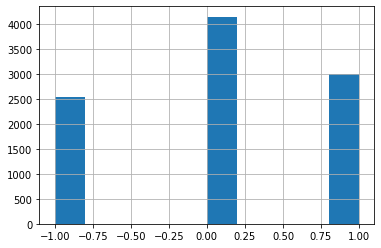

In [63]:
from labels import triple_barrier
import importlib
import numpy as np
importlib.reload(triple_barrier)

# df,labels_df = triple_barrier.calc_triple_barrier1(df_backtested, 
#                                                   col_series="5m_close", 
#                                                   col_timestamps="5m_close_time",
#                                                   horizon_delta = 5,
#                                                   upper_delta=0.001,
#                                                   lower_delta=-0.001, 
#                                                   labels=2)

# df = triple_barrier.calc_triple_barrier(df_backtested, 
#                                                   col_series="5m_close", 
#                                                   col_timestamps="5m_close_time",
#                                                   labels=3,
#                                                   fill_no_trades = False,
#                                                   horizon_delta = 5,
#                                                   vol_span = 144, 
#                                                   upper_z = 5, 
#                                                   lower_z = -5,
#                                                   upper_delta=0.01,
#                                                   lower_delta=-0.01)
# df[["label"]].hist()




def calc_labels(df0, 
                lookahead_window,
                threshold,
                labels=3,
                timeframe = "5m"):
    """ for each datetime, if next <<lookahead_window>> logreturns >0 then label is 1, else -1"""
    
    df = df0.copy()
    
    np_log_price = np.log(df[[f"{timeframe}_high", f"{timeframe}_low"]].mean(axis=1).values)
    np_close_time = df[f"{timeframe}_close_time"]
    # get midprice
    
    n = len(np_log_price)
    np_labels = np.full(n, np.nan)
    np_label_dates = np.full(n, np.nan)
    
    for i, t_seconds in enumerate(np_close_time):
        start_log_price = np_log_price[i]
        np_log_returns = np_log_price[i:i+lookahead_window] - start_log_price
        
        if labels == 2:
            if np_log_returns[-1] <threshold:
                label = -1
            else:
                label = 1
        elif labels == 3:
            if np_log_returns[-1] <-threshold:
                label = -1
            elif np_log_returns[-1] >threshold :
                label = 1
            else:
                label = 0
        np_labels[i] = label
    
    df["label"] = np_labels
    return df

###########################################
# Run labels
###########################################
timeframe = "3h"
number_of_labels=3
df = df_sigs_dict[timeframe].copy()
print(f"Columns before adding label: \n{df.columns}\n")
lookahead_window=8
threshold=0.0001
df_labelled = calc_labels(df, labels=number_of_labels,lookahead_window=lookahead_window, threshold=threshold, timeframe=timeframe)

print(f"Columns after adding label: \n{df_labelled.columns}\n")
df_labelled["label"].hist()

### i) Label analyses

CONVERTING TIMEZONE: UTC ----> Asia/Singapore
initially: 2023-04-12 06:00:00
now: 2023-04-12 14:00:00+08:00
now: 2023-04-12 14:00:00
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}]
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}] --> LIST DETECTED
yaxis:  y   2
plotting: [{'instrument': 'BTC-USDT', 'open': '3h_open', 'high': '3h_high', 'low': '3h_low', 'close': '3h_close', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 0.25}]
plotting: [{'instrument': 'BTC-USDT', 'open': '3h_open', 'high': '3h_high', 'low': '3h_low', 'close': '3h_close', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 0.25}] --> LIST DETECTED
y

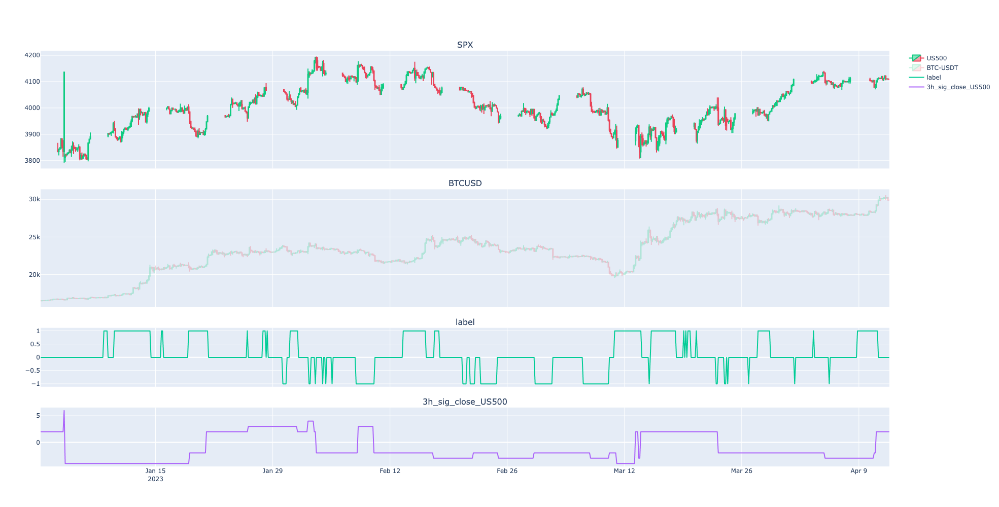

In [146]:

import importlib
from performance import plotly_studies
importlib.reload(plotly_studies)


# window = ["2022-01-01","2022-12-31"] 
window = ["2023-01-01","2023-12-31"]


ohlc = {"instrument":instruments[0].split("__")[1],
        "open":f"{timeframe}_open",
        "high":f"{timeframe}_high",
        "low":f"{timeframe}_low",
        "close":f"{timeframe}_close",
        "up_color":'rgb(14,203,129)',
        "down_color":'rgb(233,67,89)',
        "opacity":0.25}


symbol_factor = instruments[1].split("__")[-1]
ohlc_factor = {"instrument": symbol_factor,
                "open":f"{timeframe}_open_{symbol_factor}",
                "high":f"{timeframe}_high_{symbol_factor}",
                "low":f"{timeframe}_low_{symbol_factor}",
                "close":f"{timeframe}_close_{symbol_factor}",
                "up_color":'rgb(14,203,129)',
                "down_color":'rgb(233,67,89)',
                "opacity":1}


cols_to_plot = [
                [ohlc_factor],
                [ohlc],["label"],["3h_sig_close_US500"],
                ]


subplot_titles = [f"SPX",f"BTCUSD","label","3h_sig_close_US500"]
# subplot_titles = ["Long/short/total cumulative PNL $", f"{instruments[0]}", "signal", 'size']#"ES1!"]
row_heights = [2,2,1,1]
ps = plotly_studies.build(cols_to_plot = cols_to_plot,
                          row_heights = row_heights,
                          height=1000,
                          width=1500,
                         resampler=False, 
                         publish=True,
                         output_path= "./telegram/",
                         output_name = "BTC model",
                         subplot_titles = subplot_titles,
                         verbose=True)
ps.plot(df_labelled[window[0]:window[1]])

## d) Data Windowing

FEATURES: ['3h_sig_open', '3h_sig_high', '3h_sig_low', '3h_sig_close', '3h_sig_volume', '1h_sig_close', '2h_sig_close', '4h_sig_close', '6h_sig_close', '12h_sig_close', '24h_sig_close']
TOTAL window: 2020-01-03 00:00:00 ----> 2023-04-25 09:00:00, len: 9668
TRAIN window: 2020-10-01 00:00:00 ----> 2021-09-30 21:00:00, len: 2920
TOTAL TRAIN window: 2020-10-01 00:00:00 ----> 2022-12-31 21:00:00, len: 6576
VAL window: 2021-10-01 00:00:00 ----> 2022-12-31 21:00:00, len: 3656
TEST window: 2023-01-01 00:00:00 ----> 2023-04-25 09:00:00, len: 916
VAL/TRAIN: 0.5559610705596107

caat features:
['3h_sig_open', '3h_sig_high', '3h_sig_low', '3h_sig_close', '3h_sig_volume', '1h_sig_close', '2h_sig_close', '4h_sig_close', '6h_sig_close', '12h_sig_close', '24h_sig_close']

labels:
['label']
features: 
['3h_sig_open', '3h_sig_high', '3h_sig_low', '3h_sig_close', '3h_sig_volume', '1h_sig_close', '2h_sig_close', '4h_sig_close', '6h_sig_close', '12h_sig_close', '24h_sig_close']


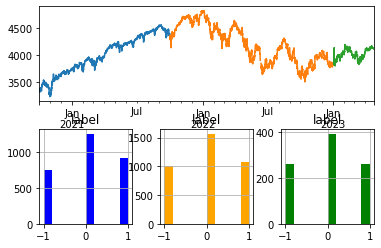

In [64]:
from catboost import Pool

import numpy as np
train_window = ["2020-10-01",'2021-09-30']
val_window = ["2021-10-01",'2022-12-31']
test_window = ['2023-01-01','2023-12-31']
# df=df.filter(regex="(1h)|(label)")
# df.dropna(inplace=True)
# df= df.filter(regex="(1h)|(label)")
df = df_labelled.copy()
timeframe = list(df.columns)[0].split("_")[0]
features = list(df.filter(regex="sig"))
cat_features = features
print(f"FEATURES: {features}")
#  Ensure cat_features are int

df[cat_features] = df[cat_features].fillna(method="ffill")
df.dropna(subset=cat_features,inplace=True)
df[cat_features]=df[cat_features].astype(int)
labels = ['label'] 

df_train = df[train_window[0]:train_window[1]].copy()
df_train_full = df[train_window[0]:val_window[1]].copy()
df_val = df[val_window[0]:val_window[1]].copy()
df_test = df[test_window[0]:test_window[1]].copy()

print(f"TOTAL window: {df.index[0]} ----> {df.index[-1]}, len: {len(df)}")
print(f"TRAIN window: {df_train.index[0]} ----> {df_train.index[-1]}, len: {len(df_train)}")
print(f"TOTAL TRAIN window: {df_train_full.index[0]} ----> {df_train_full.index[-1]}, len: {len(df_train_full)}")
print(f"VAL window: {df_val.index[0]} ----> {df_val.index[-1]}, len: {len(df_val)}")
print(f"TEST window: {df_test.index[0]} ----> {df_test.index[-1]}, len: {len(df_test)}")
print(f"VAL/TRAIN: {len(df_val)/(len(df_val)+len(df_train))}")
print(f"\ncaat features:\n{cat_features}")
print(f"\nlabels:\n{labels}\nfeatures: \n{features}")


# %matplotlib widget
import matplotlib.pyplot as plt
fig, axs = plt.subplot_mosaic("AAA;BCD")
df_train[f"{timeframe}_close"].plot(ax=axs["A"])
df_val[f"{timeframe}_close"].plot(ax=axs["A"])
df_test[f"{timeframe}_close"].plot(ax=axs["A"])
df_train[labels].hist(ax=axs["B"], color="blue")
df_val[labels].hist(ax=axs["C"],color="orange")
df_test[labels].hist(ax=axs["D"],color="green")
# df[test_window[1]:][labels].hist(ax=axs["D"],color="green")
# label_train = df_train[labels].value_counts()

train_dataset = Pool(df_train[features],df_train[labels], cat_features=cat_features)
train_full_dataset = Pool(df_train_full[features],df_train_full[labels], cat_features=cat_features)
val_dataset = Pool(df_val[features],df_val[labels],cat_features=cat_features)
test_dataset = Pool(df_test[features],df_test[labels],cat_features=cat_features)

# 

## e) Build model

### i) Run Model

In [65]:
# from catboost import CatBoostClassifier, Pool

# model = CatBoostClassifier(task_type="GPU",iterations=iterations)
# model.fit(X=df_train[features], y=df_train[labels],cat_features = cat_features, verbose=False,plot=True)
from catboost import CatBoostClassifier
import time
t0 = time.time()
model = CatBoostClassifier(task_type="CPU",iterations=2000)
# grid = {'iterations': [100, 150, 200],
#         'learning_rate': [0.03, 0.1],
#         'depth': [2, 4, 6, 8],
#         'l2_leaf_reg': [0.2, 0.5, 1, 3]}

# model.grid_search(grid, train_dataset)
model.fit(train_dataset, eval_set=val_dataset, verbose=False,plot=True)

t1 = np.round(time.time()-t0,3)
print(f"train duration: {t1}s")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

train duration: 47.051s


### ii) Model Performance

In [59]:
# %matplotlib widget
from sklearn.metrics import accuracy_score, f1_score
# import shap
import pandas as pd
cat_features=[]

def calc_accuracy(model, features,cat_features, labels, df_train,df_test, feature_importances=False):
    train_y_pred = model.predict(df_train[features])
    model_reports = {}
    model_reports["IST Acc"] =  accuracy_score(df_train[labels], train_y_pred)
    model_reports["IST F1"] = f1_score(df_train[labels], train_y_pred,average="weighted")
    
    train_y_pred = model.predict(df_train[features])
    train_y_probs = model.predict_proba(df_train[features])
    
    test_y_pred = model.predict(df_test[features])
    test_y_probs = model.predict_proba(df_test[features])
    
    
    model_reports["OST Acc"] =  accuracy_score(df_test[labels], test_y_pred)
    model_reports["OST F1"] = f1_score(df_test[labels], test_y_pred,average="weighted")
    
    if feature_importances:
        df_fi = pd.DataFrame(model.feature_importances_, index=df_train[features].columns, ).sort_values(by=0,ascending=False)
        fi_top = df_fi[df_fi>1].dropna()
        print(fi_top)
        fi_bot = df_fi[df_fi<=1].dropna()
        print(fi_bot)
        
        print(model_reports)
#         explainer = shap.TreeExplainer(model)
#         shap_values = explainer.shap_values(Pool(df_train[features], df_train[labels], cat_features=cat_features))
# #         shap.summary_plot(shap_values, df_train[features], plot_type="bar")
#         shap.summary_plot(shap_values, df_train[features])
    return model_reports


In [66]:
model_reports = calc_accuracy(model, features,cat_features, labels, df_train,df_test,feature_importances=True)




df_to_backtest = df.copy() 
target_signal = "3h_sig_close"

y_pred = model.predict(df_to_backtest[features])
y_probs = model.predict_proba(df_to_backtest[features])

df_to_backtest["Y"] = y_pred
if number_of_labels >2:
    
    df_to_backtest["p_u"] = y_probs[:,2]
    df_to_backtest["p_s"] = y_probs[:,1]
    df_to_backtest["p_d"] = y_probs[:,0]
    signals = ["signal","p_u","p_s","p_d","Y"]
else: 
    df_to_backtest["p"] = y_probs[:,-1]
    signals = ["signal","p","Y"]
df_to_backtest["signal"] = df_to_backtest[target_signal]


                       0
1h_sig_close   22.827161
3h_sig_high    16.960212
2h_sig_close   14.697006
3h_sig_close    8.232168
3h_sig_volume   7.604375
12h_sig_close   6.567508
24h_sig_close   5.536972
3h_sig_open     5.533192
4h_sig_close    4.996088
3h_sig_low      4.807128
6h_sig_close    2.238191
Empty DataFrame
Columns: [0]
Index: []
{'IST Acc': 0.48253424657534244, 'IST F1': 0.38276490436932803, 'OST Acc': 0.37663755458515286, 'OST F1': 0.31445397229330063}


## f) Backtest

### ii) run backtest

In [67]:
# ============================
# Backtest parameters
# ============================
# fee = 0.0005
fee = 0.000
slippage = 0.0

min_holding_period = 0
max_holding_period = 1e6

long_equity = 5e5
long_notional=5e5
short_equity = 5e5
short_notional= 5e5

signal_function="Y"
# signal_function="pud"
figsize = (20,15) #(20,29) # width, height
# figsize = (20,30)
# window =["2020-11-02","2022-08-23"] # - 0th backtest
# window =["2022-01-01","2023-12-31"] 
window =["2021-01-01","2023-12-31"] 

tradable_times = [["00:05", "23:50"]]
closing_session_times= [["23:50", "00:00"]]

kline_to_trade = list(df_to_backtest.columns)[3]
volume_to_trade = list(df_to_backtest.columns)[4]





title = f"{timeframe} AUDUSD | fees: {fee*1e4} bps"
file_name = f"{timeframe} AUDUSD {lookahead_window}_{threshold}"

In [ ]:
df[]

tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|██████████████████████████████████████| 6756/6756 [00:00<00:00, 78179.10it/s]


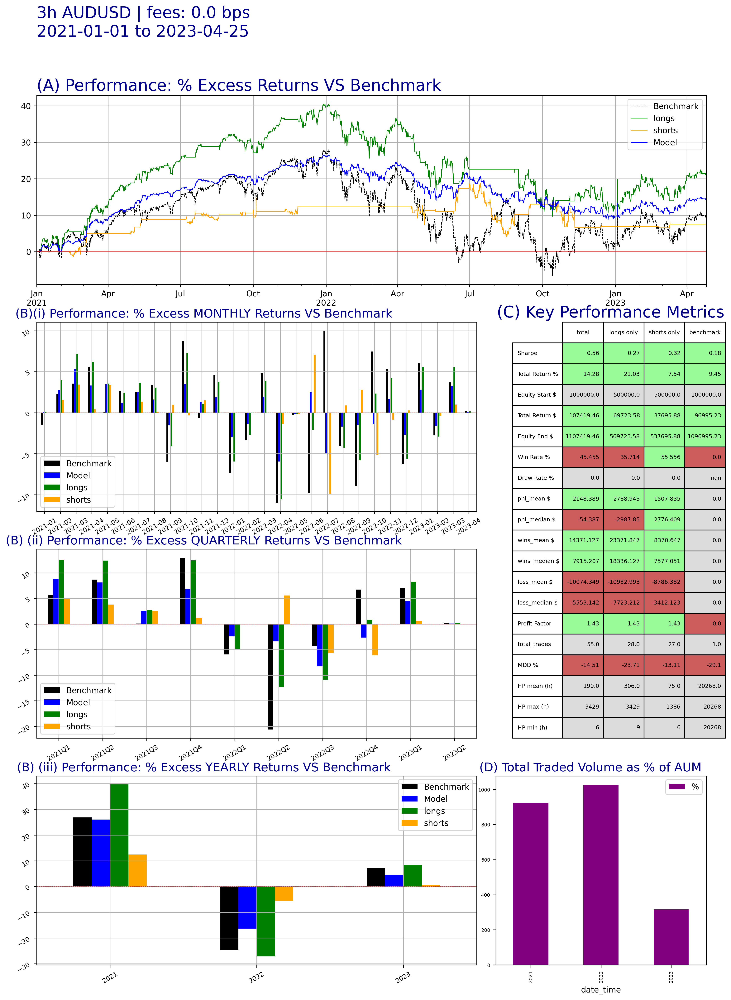

In [68]:
import importlib
from performance import metrics
importlib.reload(metrics)
from performance import backtest_plot
importlib.reload(backtest_plot)
from backtester import backtest
importlib.reload(backtest)
df_backtested,df_trades,df_summary = backtest.backtest(model_name= "Momentum",#"Mean_Reversion",
                                                       df0=df_to_backtest[window[0]:window[1]],
                                                       kline_to_trade=kline_to_trade,
                                                       volume_to_trade = volume_to_trade,
                                                       tradable_times = tradable_times,
                                                       closing_session_times = closing_session_times,
                                                       position_sizing_to_trade=None,
                                                       min_holding_period=min_holding_period/int(timeframe[:-1]),
                                                       max_holding_period=max_holding_period/int(timeframe[:-1]),
                                                       fee=fee,
                                                       slippage=slippage,
                                                       long_equity = long_equity,
                                                       short_equity = short_equity,
                                                       long_notional=long_notional,
                                                       short_notional=short_notional,
                                                       horizon_labels=None, #test_window[0],
                                                       signals=signals, 
                                                       signal_function=signal_function, 
                                                       figsize=figsize, # width, height
                                                       show_B=True,
                                                       show_LS=True,
                                                       title=title,
                                                       file_name=file_name,
                                                       plots="ppt",
                                                       diagnostics_verbose=False,
                                                       trail_SL = None,
                                                       trail_TP = None,
                                                       trail_increment = None,
                                                       N=365*8,
                                                       )

### iii) Backtest analyses plotly

CONVERTING TIMEZONE: UTC ----> Asia/Singapore
initially: 2023-03-31 09:00:00
now: 2023-03-31 17:00:00+08:00
now: 2023-03-31 17:00:00
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl']
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl'] --> LIST DETECTED
cum_A_pnl -> line plot
cum_S_pnl -> line plot
cum_L_pnl -> line plot
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}]
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}] --> LIST DETECTED
yaxis:  y   2
plotting: [{'instrument': 'BTC-USDT', 'open': '3h_open', 'high': '3h_high', 'low': '3h_low', 'close': '3h_close', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 0.25}, 'L_entry_price', 'L_exit_pr

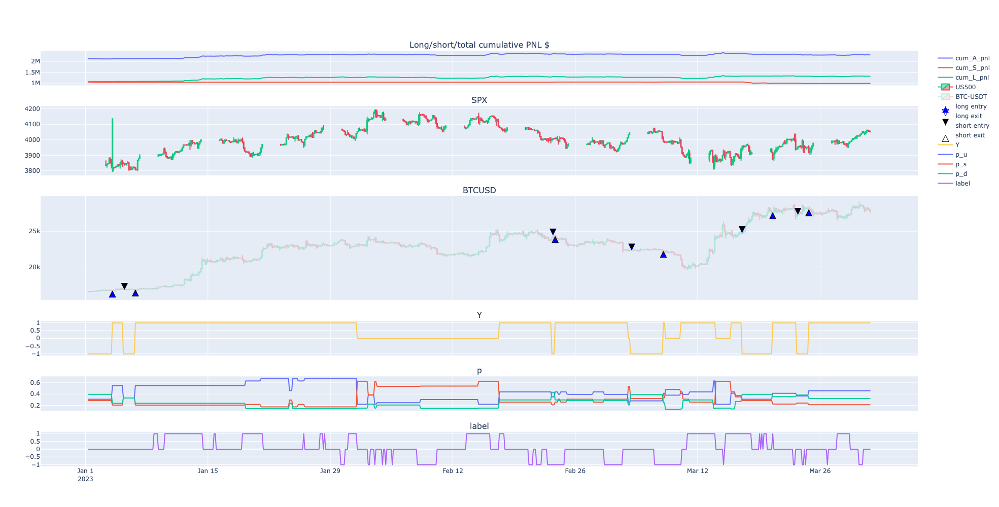

In [15]:

import importlib
from performance import plotly_studies
importlib.reload(plotly_studies)


# window = ["2022-01-01","2022-12-31"] 
window = ["2023-01-01","2023-12-31"]
# window = ["2023-03-26","2023-12-31"]

timeframe = "3h"

ohlc = {"instrument":instruments[0].split("__")[1],
        "open":f"{timeframe}_open",
        "high":f"{timeframe}_high",
        "low":f"{timeframe}_low",
        "close":f"{timeframe}_close",
        "up_color":'rgb(14,203,129)',
        "down_color":'rgb(233,67,89)',
        "opacity":0.25}


symbol_factor = instruments[1].split("__")[-1]
ohlc_factor = {"instrument": symbol_factor,
                "open":f"{timeframe}_open_{symbol_factor}",
                "high":f"{timeframe}_high_{symbol_factor}",
                "low":f"{timeframe}_low_{symbol_factor}",
                "close":f"{timeframe}_close_{symbol_factor}",
                "up_color":'rgb(14,203,129)',
                "down_color":'rgb(233,67,89)',
                "opacity":1}

if number_of_labels >2:
    to_plot_ps = ["p_u","p_s","p_d"]
else:
    to_plot_ps = ["p"]
cols_to_plot = [["cum_A_pnl", "cum_S_pnl","cum_L_pnl"],
                [ohlc_factor],
                [ohlc,'L_entry_price','L_exit_price','S_entry_price','S_exit_price',],
                ["Y"],to_plot_ps,["label"]
                ]


subplot_titles = ["Long/short/total cumulative PNL $",f"SPX",f"BTCUSD", "Y", "p", "label"]
# subplot_titles = ["Long/short/total cumulative PNL $", f"{instruments[0]}", "signal", 'size']#"ES1!"]
row_heights = [1,2,3,1,1,1]
ps = plotly_studies.build(cols_to_plot = cols_to_plot,
                          row_heights = row_heights,
                          height=1000,
                          width=1500,
                         resampler=False, 
                         publish=True,
                         output_path= "./telegram/",
                         output_name = "BTC model",
                         subplot_titles = subplot_titles,
                         verbose=True)
ps.plot(df_backtested[window[0]:window[1]])

## g) Optimisations

### i) Opt

In [81]:
window

['2021-01-01', '2023-12-31']

In [83]:
from catboost import Pool

import numpy as np

from catboost import CatBoostClassifier
import time


from sklearn.metrics import accuracy_score, f1_score
# import shap
import pandas as pd
import importlib
from performance import metrics
importlib.reload(metrics)
from performance import backtest_plot
importlib.reload(backtest_plot)
from backtester import backtest
importlib.reload(backtest)

mat_sharpe = {}
mat_ret = {}
mat_acc = {}

lookahead_windows = [2,3,4,5,6,7,8,9,10,12,13,14,15,16,17,18,19,20,21,22,23,24]
thresholds =  np.arange(0.01,0.1,0.005)
for lookahead_window in lookahead_windows:
    print(f"Running model for horizon: {lookahead_window}")
    temp_sharpe = {}
    temp_ret = {}
    temp_acc = {}
    for threshold in thresholds:
        temp2= {}
        print(f" ------> Running model for threshold: {threshold}")
        
        
        timeframe = "3h"
        number_of_labels=3
        df = df_sigs_dict[timeframe].copy()
        # print(f"Columns before adding label: \n{df.columns}\n")

        df_labelled = calc_labels(df, labels=number_of_labels,lookahead_window=lookahead_window, threshold=threshold, timeframe=timeframe)

        # print(f"Columns after adding label: \n{df_labelled.columns}\n")


        train_window = ["2020-10-01",'2021-09-30']
        val_window = ["2021-10-01",'2021-12-31']
        test_window = ['2022-01-01','2022-12-31']
        # df=df.filter(regex="(1h)|(label)")
        # df.dropna(inplace=True)
        # df= df.filter(regex="(1h)|(label)")
        df = df_labelled.copy()
        timeframe = list(df.columns)[0].split("_")[0]
        features = list(df.filter(regex="sig"))
        cat_features = features
        #  Ensure cat_features are int

        df[cat_features] = df[cat_features].fillna(method="ffill")
        df.dropna(subset=cat_features,inplace=True)
        df[cat_features]=df[cat_features].astype(int)
        labels = ['label'] 

        df_train = df[train_window[0]:train_window[1]].copy()
        df_train_full = df[train_window[0]:val_window[1]].copy()
        df_val = df[val_window[0]:val_window[1]].copy()
        df_test = df[test_window[0]:test_window[1]].copy()


        train_dataset = Pool(df_train[features],df_train[labels], cat_features=cat_features)
        train_full_dataset = Pool(df_train_full[features],df_train_full[labels], cat_features=cat_features)
        val_dataset = Pool(df_val[features],df_val[labels],cat_features=cat_features)
        test_dataset = Pool(df_test[features],df_test[labels],cat_features=cat_features)


        t0 = time.time()
        model = CatBoostClassifier(task_type="CPU",iterations=200)
        # grid = {'iterations': [100, 150, 200],
        #         'learning_rate': [0.03, 0.1],
        #         'depth': [2, 4, 6, 8],
        #         'l2_leaf_reg': [0.2, 0.5, 1, 3]}

        # model.grid_search(grid, train_dataset)
        model.fit(train_dataset, eval_set=val_dataset, verbose=False,plot=False)

        t1 = np.round(time.time()-t0,3)
        print(f"train duration: {t1}s")
        
        
        # =======================================
        # model post
        # =======================================
        model_reports = calc_accuracy(model, features,cat_features, labels, df_train,df_test,feature_importances=False)




        df_to_backtest = df.copy() 
        target_signal = "3h_sig_close_US500"

        y_pred = model.predict(df_to_backtest[features])
        y_probs = model.predict_proba(df_to_backtest[features])

        df_to_backtest["Y"] = y_pred
        if number_of_labels >2:

            df_to_backtest["p_u"] = y_probs[:,2]
            df_to_backtest["p_s"] = y_probs[:,1]
            df_to_backtest["p_d"] = y_probs[:,0]
            signals = ["signal","p_u","p_s","p_d","Y"]
        else: 
            df_to_backtest["p"] = y_probs[:,-1]
            signals = ["signal","p","Y"]
        df_to_backtest["signal"] = df_to_backtest[target_signal]

        
        
        
        # =======================================
        # backtest
        # =======================================
        
        # ============================
        # Backtest parameters
        # ============================
        # fee = 0.0005
        fee = 0
        slippage = 0.0

        min_holding_period = 0
        max_holding_period = 1e6

        long_equity = 5e5
        long_notional=5e5
        short_equity = 5e5
        short_notional= 5e5

        signal_function="Y"
        # signal_function="pud"
        figsize = (20,15) #(20,29) # width, height
        # figsize = (20,30)
        # window =["2020-11-02","2022-08-23"] # - 0th backtest
        # window =["2022-01-01","2023-12-31"] 
        window =["2021-01-01","2023-12-31"] 

        tradable_times = [["00:05", "23:50"]]
        closing_session_times= [["23:50", "00:00"]]

        kline_to_trade = list(df_to_backtest.columns)[3]
        volume_to_trade = list(df_to_backtest.columns)[4]





        title = f"{timeframe} BTC spot | fees: {fee*1e4} bps"
        file_name = f"{timeframe} BTC Model"
        
        
        
        
        df_backtested,df_trades,df_summary = backtest.backtest(model_name= "Momentum",#"Mean_Reversion",
                                                               df0=df_to_backtest[train_window[0]:val_window[1]],
                                                               kline_to_trade=kline_to_trade,
                                                               volume_to_trade = volume_to_trade,
                                                               tradable_times = tradable_times,
                                                               closing_session_times = closing_session_times,
                                                               position_sizing_to_trade=None,
                                                               min_holding_period=min_holding_period/int(timeframe[:-1]),
                                                               max_holding_period=max_holding_period/int(timeframe[:-1]),
                                                               fee=fee,
                                                               slippage=slippage,
                                                               long_equity = long_equity,
                                                               short_equity = short_equity,
                                                               long_notional=long_notional,
                                                               short_notional=short_notional,
                                                               horizon_labels=test_window[0],
                                                               signals=signals, 
                                                               signal_function=signal_function, 
                                                               figsize=figsize, # width, height
                                                               show_B=True,
                                                               show_LS=True,
                                                               title=title,
                                                               file_name=None,#"BTC OST",
                                                               plots=False,
                                                               diagnostics_verbose=False,
                                                               trail_SL = None,
                                                               trail_TP = None,
                                                               trail_increment = None,
                                                               )
        
        
        temp_sharpe[threshold] = df_summary.loc["Sharpe","total"]
        temp_ret[threshold] = df_summary.loc["Total Return %","total"]
        temp_acc[threshold] =  model_reports["OST Acc"]
    
    mat_sharpe[lookahead_window] = temp_sharpe
    mat_ret[lookahead_window] = temp_ret
    mat_acc[lookahead_window] = temp_acc

Running model for horizon: 2
 ------> Running model for threshold: 0.01
train duration: 1.835s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 589103.93it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.015
train duration: 1.954s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 313150.94it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.019999999999999997
train duration: 2.178s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 281773.13it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.024999999999999998
train duration: 2.046s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 289721.42it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 2.158s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 584768.16it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.034999999999999996
train duration: 2.421s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 468611.54it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.039999999999999994
train duration: 2.2s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 441925.57it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.045
train duration: 2.339s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 493050.88it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.049999999999999996
train duration: 2.476s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 461503.46it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.05499999999999999
train duration: 2.468s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 445520.65it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.05999999999999999
train duration: 2.402s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 420823.17it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06499999999999999
train duration: 2.527s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 402857.70it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06999999999999999
train duration: 2.91s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 400270.83it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.07499999999999998
train duration: 2.869s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 463498.23it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.07999999999999999
train duration: 2.413s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 445805.61it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08499999999999998
train duration: 2.448s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 378495.72it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08999999999999998
train duration: 2.783s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 441480.26it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.09499999999999999
train duration: 2.495s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 400260.38it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 3
 ------> Running model for threshold: 0.01
train duration: 2.924s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 215297.87it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.015
train duration: 2.813s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 250971.77it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.019999999999999997
train duration: 2.78s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 451303.06it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.024999999999999998
train duration: 2.74s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 426156.11it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.03
train duration: 3.203s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 389681.98it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.034999999999999996
train duration: 2.693s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 247045.73it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.773s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 246161.35it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.254s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 463232.20it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.049999999999999996
train duration: 2.685s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 413626.51it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.05499999999999999
train duration: 2.912s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 412258.72it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.05999999999999999
train duration: 2.649s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 447705.92it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06499999999999999
train duration: 3.221s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 341431.59it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06999999999999999
train duration: 2.764s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 264718.96it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.825s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 243005.49it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.847s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 441760.07it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08499999999999998
train duration: 3.002s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 314848.38it/s]

 ------> Running model for threshold: 0.08999999999999998



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



train duration: 4.055s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 362729.16it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.09499999999999999
train duration: 3.254s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 441391.31it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 4
 ------> Running model for threshold: 0.01
train duration: 3.225s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 207409.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.015
train duration: 2.907s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 215515.73it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.019999999999999997
train duration: 2.861s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 259746.18it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.024999999999999998
train duration: 2.78s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 229347.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.523s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 153054.48it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.815s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 442078.46it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.039999999999999994
train duration: 3.281s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 196579.44it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.13s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 157517.98it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.68s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 425564.77it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.05499999999999999
train duration: 3.307s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 355299.60it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.05999999999999999
train duration: 3.023s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 405961.28it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06499999999999999
train duration: 3.314s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 327161.26it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06999999999999999
train duration: 3.276s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 406671.85it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.07499999999999998
train duration: 2.892s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 388576.02it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.07999999999999999
train duration: 2.883s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 410372.13it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08499999999999998
train duration: 3.512s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 256543.51it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08999999999999998
train duration: 4.821s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 334687.46it/s]

 ------> Running model for threshold: 0.09499999999999999



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



train duration: 2.992s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 414711.58it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 5
 ------> Running model for threshold: 0.01
train duration: 3.612s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171339.55it/s]

 ------> Running model for threshold: 0.015



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



train duration: 4.34s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 197760.84it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.019999999999999997
train duration: 3.632s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 130979.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.024999999999999998
train duration: 4.117s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 222517.89it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.026s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 191454.73it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.743s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 341211.26it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.039999999999999994
train duration: 3.417s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 285731.93it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.283s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 187988.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.366s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 189655.12it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.059s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 205750.45it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.663s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 319586.00it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06499999999999999
train duration: 4.501s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 324949.68it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06999999999999999
train duration: 3.291s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 225512.15it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 3.616s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 225306.72it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.741s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 386100.70it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08499999999999998
train duration: 2.945s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 376368.34it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08999999999999998
train duration: 3.063s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 422702.41it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.09499999999999999
train duration: 3.535s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 424234.37it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 6
 ------> Running model for threshold: 0.01
train duration: 3.118s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 183816.92it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.015
train duration: 3.607s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 143170.09it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.019999999999999997
train duration: 3.49s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 245173.48it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.024999999999999998
train duration: 3.231s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 208565.69it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.869s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 208792.88it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.679s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 292691.02it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.023s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 209425.92it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 4.097s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 300285.42it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.049999999999999996
train duration: 3.408s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 453089.93it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.05499999999999999
train duration: 3.32s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 232040.18it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.705s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171619.52it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 5.672s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 224019.74it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06999999999999999
train duration: 7.992s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 336118.00it/s]

 ------> Running model for threshold: 0.07499999999999998


/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars




train duration: 4.419s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 393249.61it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.07999999999999999
train duration: 4.033s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 256166.38it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08499999999999998
train duration: 3.787s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 251428.54it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.08999999999999998
train duration: 4.964s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 268130.36it/s]

 ------> Running model for threshold: 0.09499999999999999



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



train duration: 3.043s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 411098.24it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 7
 ------> Running model for threshold: 0.01
train duration: 3.13s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 213805.93it/s]


 ------> Running model for threshold: 0.015
train duration: 3.406s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 220959.60it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.019999999999999997
train duration: 4.221s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 191744.41it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.024999999999999998
train duration: 4.703s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 143136.68it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.539s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 220002.23it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.56s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 188094.15it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 4.178s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 176704.03it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.132s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 185412.74it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.306s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 228254.65it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.194s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 240429.85it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.422s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 355645.69it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.06499999999999999
train duration: 3.947s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 157850.38it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.632s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 221077.47it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.807s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 240162.50it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.758s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 194635.72it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 2.956s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212534.66it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.805s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 260376.88it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.768s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 404025.28it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 8
 ------> Running model for threshold: 0.01
train duration: 3.154s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 168509.62it/s]


 ------> Running model for threshold: 0.015
train duration: 2.993s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 234915.98it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.019999999999999997
train duration: 2.856s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 230332.34it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.024999999999999998
train duration: 2.802s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 243348.71it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 2.86s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 221185.89it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.812s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 250259.09it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.114s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 193777.33it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.753s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 201574.48it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.755s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 246557.15it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.717s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171175.06it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.907s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 230883.75it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 2.806s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 203271.23it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.908s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 213187.66it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.89s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 236342.52it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.833s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 229432.87it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 2.652s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 204553.80it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.977s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 444551.96it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.09499999999999999
train duration: 2.686s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 406133.31it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 9
 ------> Running model for threshold: 0.01
train duration: 3.391s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 155322.56it/s]


 ------> Running model for threshold: 0.015
train duration: 3.683s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 164641.45it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.625s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 222192.24it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.756s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 139723.51it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.259s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 244809.47it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.793s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 255526.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.085s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 243248.34it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.822s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 191082.56it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.683s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 232423.54it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.812s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171131.12it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.782s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 228629.00it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 2.784s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 217932.37it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.253s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 197587.56it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.765s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 237433.04it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.796s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 175362.24it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.311s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 188612.38it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 3.322s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 213335.96it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.09499999999999999
train duration: 2.899s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 455120.51it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 10
 ------> Running model for threshold: 0.01
train duration: 3.222s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 183929.37it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.015
train duration: 4.436s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 161569.24it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 2.886s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 195726.33it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 2.792s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 187629.25it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 2.768s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 221415.84it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.668s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 223745.17it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.645s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 234044.71it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.026s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 203368.28it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.253s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 190236.28it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 4.27s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 160181.92it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.916s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 206788.15it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 2.79s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 241064.84it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.6s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 160781.51it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.814s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 250136.62it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.776s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 243801.38it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.113s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 190427.63it/s]

 ------> Running model for threshold: 0.08999999999999998



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



train duration: 3.165s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 185226.85it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 3.236s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 433186.68it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 12
 ------> Running model for threshold: 0.01
train duration: 3.837s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 157558.44it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.015
train duration: 3.868s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 123163.72it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.798s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 168735.84it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.392s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 229271.64it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.328s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 242329.61it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.34s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 246827.02it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.88s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 237679.61it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.801s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 248032.73it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.756s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 269615.39it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.063s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 237153.97it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.942s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 229011.42it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 3.451s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 168986.87it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.672s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 187525.99it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 3.967s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 115714.54it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.677s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 161007.72it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.961s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 125830.84it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 3.322s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 420315.64it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

 ------> Running model for threshold: 0.09499999999999999
train duration: 4.689s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|████████████████████████████████████| 3656/3656 [00:00<00:00, 45194.95it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



Running model for horizon: 13
 ------> Running model for threshold: 0.01
train duration: 3.805s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 199942.31it/s]


 ------> Running model for threshold: 0.015
train duration: 3.36s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 222105.35it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.384s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171834.91it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.572s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 180855.49it/s]


 ------> Running model for threshold: 0.03
train duration: 3.124s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 143125.99it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.687s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212968.56it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.284s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 144523.49it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 4.544s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 221992.81it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.691s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 216869.03it/s]

 ------> Running model for threshold: 0.05499999999999999



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



train duration: 3.896s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 136011.77it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.901s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 235042.00it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 4.079s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 159177.61it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.932s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171418.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 3.003s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 203257.76it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.114s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 243619.34it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.031s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 236342.52it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.918s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171998.74it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 3.031s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 377693.98it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:172: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:173: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:174: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value enc

Running model for horizon: 14
 ------> Running model for threshold: 0.01
train duration: 2.9s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 233240.18it/s]


 ------> Running model for threshold: 0.015
train duration: 3.606s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 134804.14it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.237s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 213826.80it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 2.943s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 203392.56it/s]


 ------> Running model for threshold: 0.03
train duration: 4.032s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 158563.67it/s]


 ------> Running model for threshold: 0.034999999999999996
train duration: 4.671s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 233208.25it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.317s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 151769.90it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.584s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 236685.43it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.396s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 166972.01it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.627s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 227857.82it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.181s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 217558.25it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 3.546s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 166129.05it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.639s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 235551.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.797s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 222993.56it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.277s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 125179.60it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 2.858s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 203551.85it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.803s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 185291.76it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.922s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 200407.44it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



Running model for horizon: 15
 ------> Running model for threshold: 0.01
train duration: 3.088s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 180742.51it/s]


 ------> Running model for threshold: 0.015
train duration: 2.976s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 217527.38it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.01s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 199552.02it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.281s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 198503.24it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.276s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 173758.66it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.342s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 218762.49it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.789s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 210573.39it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.801s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 230211.31it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.984s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 194779.12it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.196s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 195414.55it/s]

 ------> Running model for threshold: 0.05999999999999999



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



train duration: 3.076s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 227351.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 3.009s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 227209.59it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.164s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212732.20it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.773s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 239738.21it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.182s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212941.95it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.034s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 223732.11it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.763s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 231847.22it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.718s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 233371.51it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



Running model for horizon: 16
 ------> Running model for threshold: 0.01
train duration: 2.786s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 207678.74it/s]


 ------> Running model for threshold: 0.015
train duration: 3.059s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 137661.37it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 4.15s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 199235.71it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.5s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 147745.67it/s]


 ------> Running model for threshold: 0.03
train duration: 3.577s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 184097.19it/s]


 ------> Running model for threshold: 0.034999999999999996
train duration: 3.255s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 198977.18it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.268s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 161927.53it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.482s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 221064.72it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.458s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 209936.28it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.856s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 243298.51it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.83s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 232377.75it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 2.845s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 236116.89it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.842s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 229288.79it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.922s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 248999.34it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.743s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 188188.79it/s]

 ------> Running model for threshold: 0.08499999999999998



/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



train duration: 3.005s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 190474.94it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.672s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 250414.39it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.702s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 252205.97it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



Running model for horizon: 17
 ------> Running model for threshold: 0.01
train duration: 3.166s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 192037.36it/s]


 ------> Running model for threshold: 0.015
train duration: 2.989s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 215373.47it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 2.888s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 171163.60it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.27s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 197452.72it/s]


 ------> Running model for threshold: 0.03
train duration: 2.846s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 221169.94it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.83s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 228816.63it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.188s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 204725.85it/s]


 ------> Running model for threshold: 0.045
train duration: 2.733s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 214691.99it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.952s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 197173.44it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.558s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 245483.55it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.893s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 235034.80it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 3.018s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 246212.74it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.758s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 226501.46it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.737s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 202605.18it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.801s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 172879.09it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.035s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 226997.70it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.724s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 248438.60it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.712s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 215300.89it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



Running model for horizon: 18
 ------> Running model for threshold: 0.01
train duration: 2.854s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 172410.65it/s]


 ------> Running model for threshold: 0.015
train duration: 2.931s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 179656.20it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 2.923s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 204031.23it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.233s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 238226.09it/s]


 ------> Running model for threshold: 0.03
train duration: 2.835s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 200098.85it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.695s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 215322.05it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 3.185s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 194549.29it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.863s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 247716.19it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.807s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 238144.70it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.809s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 241307.62it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.816s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 246098.15it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 2.881s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 256844.30it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.16s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 232036.67it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.91s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 259992.80it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.795s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 246410.56it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.107s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 197592.65it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.682s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 225651.53it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.668s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 213889.44it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



Running model for horizon: 19
 ------> Running model for threshold: 0.01
train duration: 2.836s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212152.40it/s]


 ------> Running model for threshold: 0.015
train duration: 2.82s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 204281.30it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 2.852s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 218043.93it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.025s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 184041.95it/s]


 ------> Running model for threshold: 0.03
train duration: 2.918s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212152.40it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.821s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 233488.78it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.937s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 182371.89it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.953s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 235442.58it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.693s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 219379.04it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.81s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 192950.76it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.173s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 248999.34it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 3.056s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 254048.63it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.738s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 252925.64it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 3.018s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 182363.21it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.049s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 225124.80it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 2.845s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 208118.45it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 3.118s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 186779.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.736s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 232610.40it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



Running model for horizon: 20
 ------> Running model for threshold: 0.01
train duration: 2.857s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 223432.20it/s]


 ------> Running model for threshold: 0.015
train duration: 2.895s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 197473.06it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 2.797s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 159301.64it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.01s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212017.47it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.439s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 143182.12it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.897s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 234159.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.799s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 194219.11it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.961s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 180219.96it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.764s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 228956.71it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.737s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212744.01it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.839s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 236974.38it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 2.74s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 249331.33it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.73s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 216884.37it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.893s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 153595.65it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.982s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 272596.58it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 2.709s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 196074.21it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.715s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 250807.58it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.714s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 234524.36it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



Running model for horizon: 21
 ------> Running model for threshold: 0.01
train duration: 2.913s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 215222.32it/s]


 ------> Running model for threshold: 0.015
train duration: 2.865s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 210296.16it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.246s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 216599.46it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 2.873s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 191543.22it/s]


 ------> Running model for threshold: 0.03
train duration: 2.865s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 209177.38it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.209s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 230734.37it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.833s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 205496.78it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.827s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 217311.60it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.267s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 179869.04it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.754s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 224265.46it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.355s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 215746.18it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 3.404s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 240607.16it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.905s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 232939.02it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 3.014s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 239017.01it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.173s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 234977.17it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 2.787s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 267172.67it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.572s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 234341.58it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.676s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 204977.62it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



Running model for horizon: 22
 ------> Running model for threshold: 0.01
train duration: 2.864s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 173269.78it/s]


 ------> Running model for threshold: 0.015
train duration: 2.851s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 220508.41it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.233s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 190040.59it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 2.882s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 236893.84it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 2.805s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 237047.65it/s]


 ------> Running model for threshold: 0.034999999999999996
train duration: 3.151s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 202199.10it/s]


 ------> Running model for threshold: 0.039999999999999994
train duration: 2.866s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 194312.63it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 2.784s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 245916.60it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.802s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 233176.34it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 2.789s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 220426.00it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 2.735s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 240777.17it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 2.892s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 199422.26it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.982s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 244123.53it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 2.872s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 238052.28it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 2.751s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 168759.98it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.062s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 261068.41it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 2.721s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 241783.22it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.716s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 247728.20it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



Running model for horizon: 23
 ------> Running model for threshold: 0.01
train duration: 2.899s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 186040.34it/s]


 ------> Running model for threshold: 0.015
train duration: 2.817s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 202359.20it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.023s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 203171.59it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 3.734s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 182691.28it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.03
train duration: 3.703s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 167829.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 2.982s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 198277.37it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 4.143s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 162844.08it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.045
train duration: 3.619s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 165888.22it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 3.624s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 184061.83it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.606s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 122611.25it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 4.266s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 180063.36it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 4.007s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 231689.59it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 3.37s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 209331.58it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 3.414s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 188949.37it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.716s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 167115.76it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 3.653s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 152459.49it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 3.568s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 230543.58it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.904s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 248995.30it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



Running model for horizon: 24
 ------> Running model for threshold: 0.01
train duration: 3.104s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 193520.56it/s]


 ------> Running model for threshold: 0.015
train duration: 3.034s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 180302.60it/s]


 ------> Running model for threshold: 0.019999999999999997
train duration: 3.43s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 191063.51it/s]


 ------> Running model for threshold: 0.024999999999999998
train duration: 2.964s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 176251.11it/s]


 ------> Running model for threshold: 0.03
train duration: 3.066s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 170761.42it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.034999999999999996
train duration: 3.139s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 170236.30it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.039999999999999994
train duration: 2.888s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 181377.45it/s]


 ------> Running model for threshold: 0.045
train duration: 3.021s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 222127.87it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.049999999999999996
train duration: 2.963s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 224075.39it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05499999999999999
train duration: 3.012s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 212087.85it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.05999999999999999
train duration: 3.08s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 138097.76it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.06499999999999999
train duration: 3.049s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 223181.80it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.06999999999999999
train duration: 2.782s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 256273.40it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.07499999999999998
train duration: 3.074s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 192613.87it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



 ------> Running model for threshold: 0.07999999999999999
train duration: 3.019s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 224761.82it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08499999999999998
train duration: 2.845s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 238403.87it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.08999999999999998
train duration: 3.198s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 325411.70it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



 ------> Running model for threshold: 0.09499999999999999
train duration: 2.925s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 3656/3656 [00:00<00:00, 235703.15it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:165: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:166: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:167: RuntimeWarning:

invalid value encountered in long_scalars

/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

invalid value encountered in double_scalars



<AxesSubplot:>

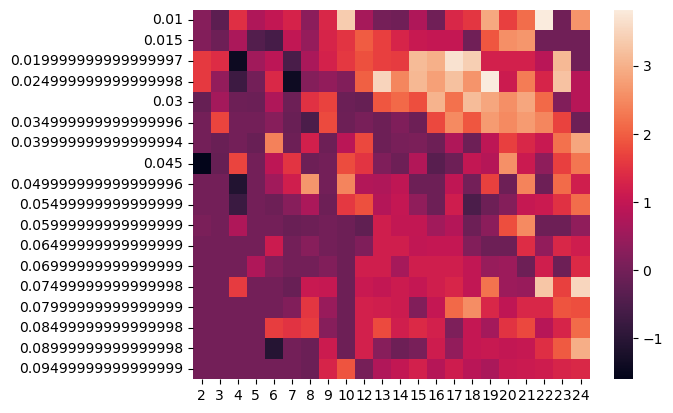

In [234]:
import matplotlib.pyplot as plt
import seaborn as sns
df_sharpe = pd.DataFrame(mat_sharpe)
sns.heatmap(df_sharpe,annot=False)


<AxesSubplot:>

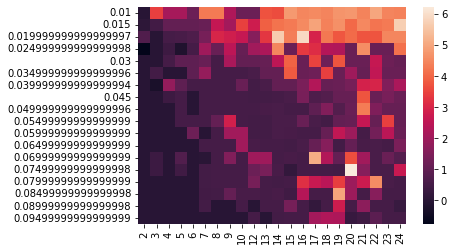

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns
df_sharpe = pd.DataFrame(mat_sharpe)
sns.heatmap(df_sharpe,annot=False)


<AxesSubplot:>

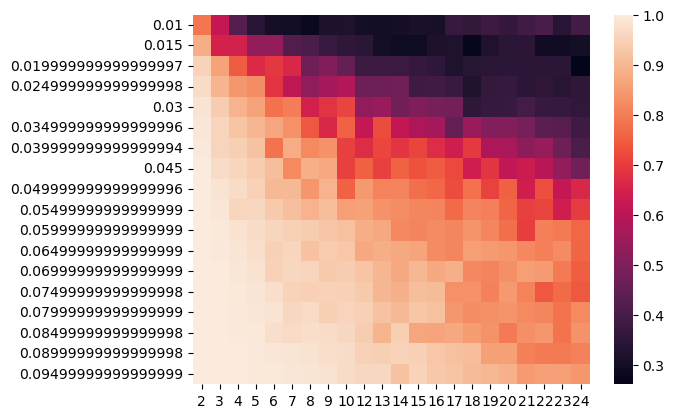

In [239]:


df_acc = pd.DataFrame(mat_acc)
sns.heatmap(df_acc,annot=False)

<AxesSubplot:>

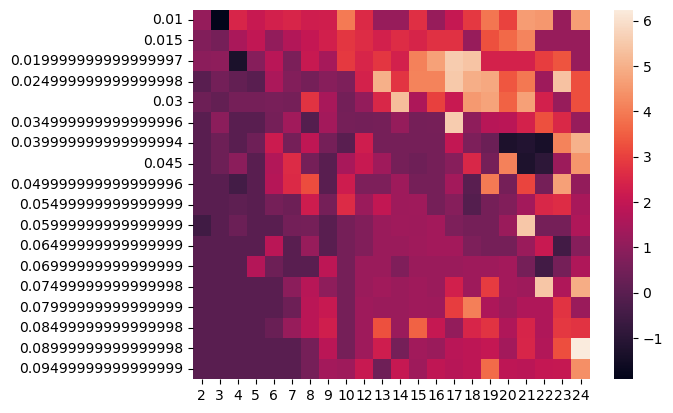

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
df_sharpe = pd.DataFrame(mat_sharpe)
sns.heatmap(df_sharpe,annot=False)


<AxesSubplot:>

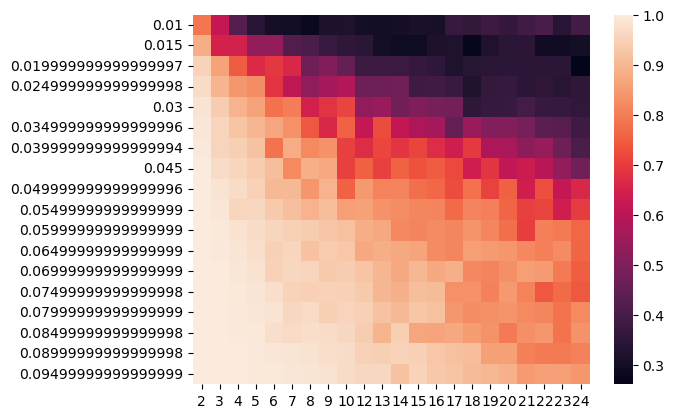

In [17]:


df_acc = pd.DataFrame(mat_acc)
sns.heatmap(df_acc,annot=False)

### ii) Run backtest

In [102]:
lookahead_window = 20
threshold = 0.075

train duration: 2.154s
tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|███████████████████████████████████| 6644/6644 [00:00<00:00, 268031.39it/s]
/Users/shaik/PycharmProjects/trading_signal_V2/performance/metrics.py:210: RuntimeWarning:

divide by zero encountered in double_scalars



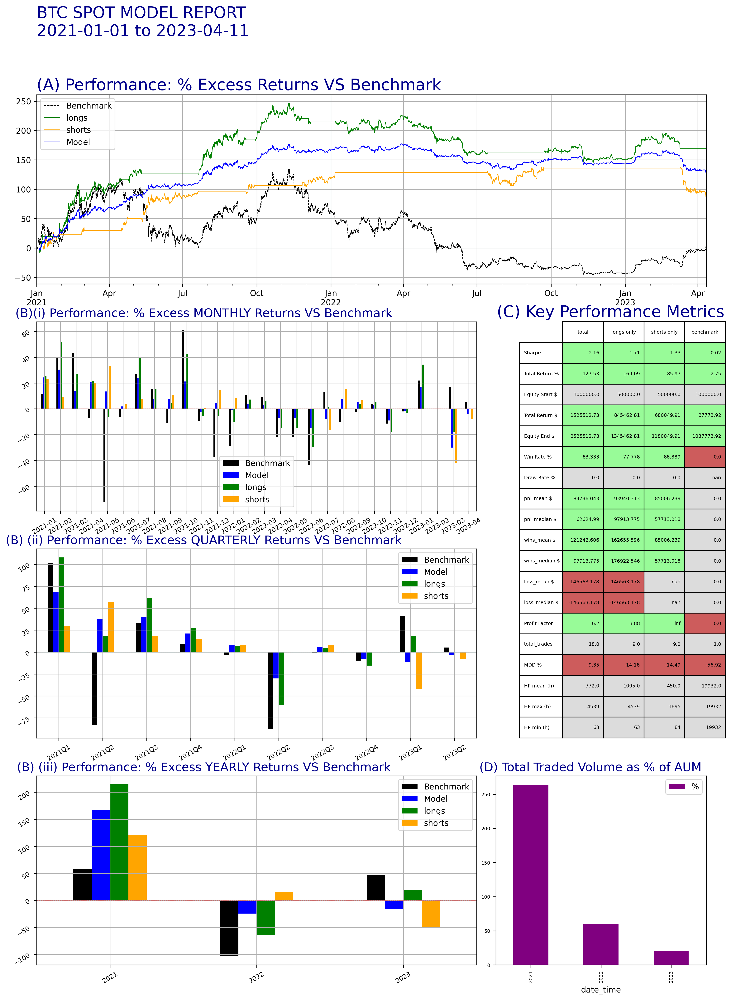

In [105]:
timeframe = "3h"
number_of_labels=3
df = df_sigs_dict[timeframe].copy()
# print(f"Columns before adding label: \n{df.columns}\n")

df_labelled = calc_labels(df, labels=number_of_labels,lookahead_window=lookahead_window, threshold=threshold, timeframe=timeframe)

# print(f"Columns after adding label: \n{df_labelled.columns}\n")


train_window = ["2020-10-01",'2021-09-30']
val_window = ["2021-10-01",'2021-12-31']
test_window = ['2022-01-01','2022-12-31']
# df=df.filter(regex="(1h)|(label)")
# df.dropna(inplace=True)
# df= df.filter(regex="(1h)|(label)")
df = df_labelled.copy()
timeframe = list(df.columns)[0].split("_")[0]
features = list(df.filter(regex="sig"))
cat_features = features
#  Ensure cat_features are int

df[cat_features] = df[cat_features].fillna(method="ffill")
df.dropna(subset=cat_features,inplace=True)
df[cat_features]=df[cat_features].astype(int)
labels = ['label'] 

df_train = df[train_window[0]:train_window[1]].copy()
df_train_full = df[train_window[0]:val_window[1]].copy()
df_val = df[val_window[0]:val_window[1]].copy()
df_test = df[test_window[0]:test_window[1]].copy()


train_dataset = Pool(df_train[features],df_train[labels], cat_features=cat_features)
train_full_dataset = Pool(df_train_full[features],df_train_full[labels], cat_features=cat_features)
val_dataset = Pool(df_val[features],df_val[labels],cat_features=cat_features)
test_dataset = Pool(df_test[features],df_test[labels],cat_features=cat_features)


t0 = time.time()
model = CatBoostClassifier(task_type="CPU",iterations=200)
# grid = {'iterations': [100, 150, 200],
#         'learning_rate': [0.03, 0.1],
#         'depth': [2, 4, 6, 8],
#         'l2_leaf_reg': [0.2, 0.5, 1, 3]}

# model.grid_search(grid, train_dataset)
model.fit(train_dataset, eval_set=val_dataset, verbose=False,plot=False)

t1 = np.round(time.time()-t0,3)
print(f"train duration: {t1}s")


# =======================================
# model post
# =======================================
model_reports = calc_accuracy(model, features,cat_features, labels, df_train,df_test,feature_importances=False)




df_to_backtest = df.copy() 
target_signal = "3h_sig_close_US500"

y_pred = model.predict(df_to_backtest[features])
y_probs = model.predict_proba(df_to_backtest[features])

df_to_backtest["Y"] = y_pred
if number_of_labels >2:

    df_to_backtest["p_u"] = y_probs[:,2]
    df_to_backtest["p_s"] = y_probs[:,1]
    df_to_backtest["p_d"] = y_probs[:,0]
    signals = ["signal","p_u","p_s","p_d","Y"]
else: 
    df_to_backtest["p"] = y_probs[:,-1]
    signals = ["signal","p","Y"]
df_to_backtest["signal"] = df_to_backtest[target_signal]




# =======================================
# backtest
# =======================================

# ============================
# Backtest parameters
# ============================
# fee = 0.0005
fee = 0
slippage = 0.0

min_holding_period = 0
max_holding_period = 1e6

long_equity = 5e5
long_notional=5e5
short_equity = 5e5
short_notional= 5e5

signal_function="Y"
# signal_function="pud"
figsize = (20,15) #(20,29) # width, height
# figsize = (20,30)
# window =["2020-11-02","2022-08-23"] # - 0th backtest
# window =["2022-01-01","2023-12-31"] 
window =["2021-01-01","2023-12-31"] 

tradable_times = [["00:05", "23:50"]]
closing_session_times= [["23:50", "00:00"]]

kline_to_trade = list(df_to_backtest.columns)[3]
volume_to_trade = list(df_to_backtest.columns)[4]





title = f"{timeframe} BTC spot | fees: {fee*1e4} bps"
file_name = f"{timeframe} BTC Model"




df_backtested,df_trades,df_summary = backtest.backtest(model_name= "Momentum",#"Mean_Reversion",
                                                       df0=df_to_backtest["2021-01-01":],
                                                       kline_to_trade=kline_to_trade,
                                                       volume_to_trade = volume_to_trade,
                                                       tradable_times = tradable_times,
                                                       closing_session_times = closing_session_times,
                                                       position_sizing_to_trade=None,
                                                       min_holding_period=min_holding_period/int(timeframe[:-1]),
                                                       max_holding_period=max_holding_period/int(timeframe[:-1]),
                                                       fee=fee,
                                                       slippage=slippage,
                                                       long_equity = long_equity,
                                                       short_equity = short_equity,
                                                       long_notional=long_notional,
                                                       short_notional=short_notional,
                                                       horizon_labels=test_window[0],
                                                       signals=signals, 
                                                       signal_function=signal_function, 
                                                       figsize=figsize, # width, height
                                                       show_B=True,
                                                       show_LS=True,
                                                       title=title,
                                                       file_name=None,#"BTC OST",
                                                       plots="ppt",
                                                       diagnostics_verbose=False,
                                                       trail_SL = None,
                                                       trail_TP = None,
                                                       trail_increment = None,
                                                       )

### iii) Plotly

CONVERTING TIMEZONE: UTC ----> Asia/Singapore
initially: 2023-03-30 06:00:00
now: 2023-03-30 14:00:00+08:00
now: 2023-03-30 14:00:00
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl']
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl'] --> LIST DETECTED
cum_A_pnl -> line plot
cum_S_pnl -> line plot
cum_L_pnl -> line plot
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}]
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}] --> LIST DETECTED
yaxis:  y   2
plotting: [{'instrument': 'BTC-USDT', 'open': '3h_open', 'high': '3h_high', 'low': '3h_low', 'close': '3h_close', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 0.25}, 'L_entry_price', 'L_exit_pr

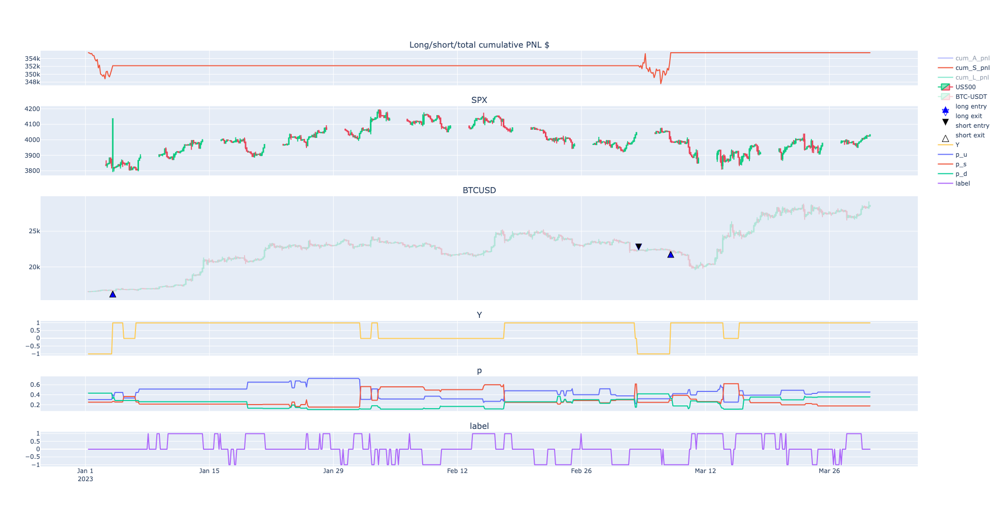

In [25]:

import importlib
from performance import plotly_studies
importlib.reload(plotly_studies)


# window = ["2022-01-01","2022-12-31"] 
window = ["2023-01-01","2023-12-31"]

timeframe = "3h"

ohlc = {"instrument":instruments[0].split("__")[1],
        "open":f"{timeframe}_open",
        "high":f"{timeframe}_high",
        "low":f"{timeframe}_low",
        "close":f"{timeframe}_close",
        "up_color":'rgb(14,203,129)',
        "down_color":'rgb(233,67,89)',
        "opacity":0.25}


symbol_factor = instruments[1].split("__")[-1]
ohlc_factor = {"instrument": symbol_factor,
                "open":f"{timeframe}_open_{symbol_factor}",
                "high":f"{timeframe}_high_{symbol_factor}",
                "low":f"{timeframe}_low_{symbol_factor}",
                "close":f"{timeframe}_close_{symbol_factor}",
                "up_color":'rgb(14,203,129)',
                "down_color":'rgb(233,67,89)',
                "opacity":1}

if number_of_labels >2:
    to_plot_ps = ["p_u","p_s","p_d"]
else:
    to_plot_ps = ["p"]
cols_to_plot = [["cum_A_pnl", "cum_S_pnl","cum_L_pnl"],
                [ohlc_factor],
                [ohlc,'L_entry_price','L_exit_price','S_entry_price','S_exit_price',],
                ["Y"],to_plot_ps,["label"]
                ]


subplot_titles = ["Long/short/total cumulative PNL $",f"SPX",f"BTCUSD", "Y", "p", "label"]
# subplot_titles = ["Long/short/total cumulative PNL $", f"{instruments[0]}", "signal", 'size']#"ES1!"]
row_heights = [1,2,3,1,1,1]
ps = plotly_studies.build(cols_to_plot = cols_to_plot,
                          row_heights = row_heights,
                          height=1000,
                          width=1500,
                         resampler=False, 
                         publish=True,
                         output_path= "./telegram/",
                         output_name = "BTC model",
                         subplot_titles = subplot_titles,
                         verbose=True)
ps.plot(df_backtested[window[0]:window[1]])

## vii) CROSS VALIDATION

In [69]:
from tqdm import tqdm
import pandas as pd
from catboost import Pool
from catboost import CatBoostClassifier
def cv(df0,window,features,cat_features,label,retrain_window=200,retrain_every=100, min_train_window = 1000, verbose = True, anchored=False, val_slice_pct=0.26):
    df=df0[window[0]:window[1]].copy()
    print(f"Initiating cross validation: {df.index[0]} --> {df.index[-1]}")
    X = df[features]
    Y = df[label]
    
    model = None
    preds = {}#np.full(len(df), np.nan) 
    probs = {}#np.full(len(df), np.nan) 
    # prog_bar = tqdm(zip(range(0,len(X)),X.index))
    for i,t in tqdm(zip(range(0,len(X)),X.index)):
        # prog_bar.set_description(f"Processing {t}")
        # print(f"Processing {t} .. ")
        # Walk forward
        if  (i>=min_train_window) and (not i%retrain_every): # (not i%retrain_window) and #and (str(t)>= window[0]):
            if anchored:
                i_start = 0
            else:
                i_start = i-retrain_window
                
            if val_slice_pct is None:
                i_end = i
            else:
                i_end = int((i-i_start)*(1-val_slice_pct))
                val_x_i = X.iloc[i_end:i,:]
                val_y_i = Y.iloc[i_end:i,:]
                val_dataset = Pool(val_x_i,val_y_i,cat_features=cat_features)   
                
                
            x_i = X.iloc[i_start:i_end,:]
            y_i = Y.iloc[i_start:i_end,:]
            try:
                train_dataset = Pool(x_i,y_i, cat_features=cat_features)
            except Exception as e:
                print(f"\nERROR\ni: {i}\ni_start: {i_start}\ni_end: {i_end}")
                break
                
            if val_slice_pct is None:
                if verbose: print(f"{i} -->  TRAIN: {x_i.index[0]} -> {x_i.index[-1]} (len: {len(x_i)})")
                model = CatBoostClassifier(task_type="CPU", iterations=2000) #2000
                model.fit(train_dataset, verbose=False, plot=False)
            else:
                if verbose: print(f"{i} -->  TRAIN: {x_i.index[0]} -> {x_i.index[-1]} (len: {len(x_i)})\n         VAL: {val_x_i.index[0]} -> {val_x_i.index[-1]} (len: {len(val_x_i)})")
                model = CatBoostClassifier(task_type="CPU", iterations=2000) #2000
                model.fit(train_dataset, eval_set=val_dataset, verbose=False, plot=False)
            
            
            # if verbose: print(f"{i+1} ---->  PREDICT ... ")
            # x_oos = X.iloc[i:i+predict_for,:]
            # if verbose: print(f"---> TEST: {x_i.index[0]} -> {x_i.index[-1]} (len: {len(x_i)})")
            # pred_t = model.predict(x_oos)
            # prob_t = model.predict_proba(x_oos)
            
            
        if model is not None:
            ## PREDICT FOR NEXT TIMEBAR if not retrain time yet
            #  this is quite fast so can afford to predict every time a new tick comes in. 
            x_oos = X.iloc[i:i+1,:]
            # if verbose: print(f"TEST: {x_oos.index[0]} -> {x_oos.index[-1]}")
            pred_t = model.predict(x_oos)[0]
            prob_d_t = model.predict_proba(x_oos)[0]
            prob_u_t = model.predict_proba(x_oos)[0]
            
            try:
                preds[t] = {"Y":pred_t[0]}
            except Exception as e:
                print(f"THIS IS CAUSE OF ERROR: {pred_t} or pred_t full: {model.predict(x_oos)}")
                break
            probs[t] = {"p_d":prob_d_t[0], "p_u":prob_u_t[-1]}
            
        if  (str(t)>= window[1]):
            print(f"{str(t)} >= {window[1]}")
            break
                
    pred_df = pd.DataFrame.from_dict(preds).T
    prob_df = pd.DataFrame.from_dict(probs).T
    df = pd.merge(df, pred_df, left_index=True, right_index=True, how="left")
    df = pd.merge(df, prob_df, left_index=True, right_index=True, how="left")
    
    
    # df["Y"] = preds
    # df["p"] = probs
    
    return df, model

In [70]:

df = df_labelled.copy().fillna(method="ffill").dropna()
timeframe = list(df.columns)[0].split("_")[0]
features = list(df.filter(regex="sig"))
cat_features = features
print(f"FEATURES: {features}")
#  Ensure cat_features are int

df[cat_features] = df[cat_features].fillna(method="ffill")
df.dropna(subset=cat_features,inplace=True)
df[cat_features]=df[cat_features].astype(int)
labels = ['label'] 

print(f"\nlabels:\n{labels}\nfeatures: \n{features} \n\n cat_features: \n{cat_features}")
print(f"TOTAL window: {df.index[0]} ----> {df.index[-1]}, len: {len(df)}")

FEATURES: ['3h_sig_open', '3h_sig_high', '3h_sig_low', '3h_sig_close', '3h_sig_volume', '1h_sig_close', '2h_sig_close', '4h_sig_close', '6h_sig_close', '12h_sig_close', '24h_sig_close']

labels:
['label']
features: 
['3h_sig_open', '3h_sig_high', '3h_sig_low', '3h_sig_close', '3h_sig_volume', '1h_sig_close', '2h_sig_close', '4h_sig_close', '6h_sig_close', '12h_sig_close', '24h_sig_close'] 

 cat_features: 
['3h_sig_open', '3h_sig_high', '3h_sig_low', '3h_sig_close', '3h_sig_volume', '1h_sig_close', '2h_sig_close', '4h_sig_close', '6h_sig_close', '12h_sig_close', '24h_sig_close']
TOTAL window: 2020-02-07 00:00:00 ----> 2023-04-25 09:00:00, len: 9388


array([[<AxesSubplot:title={'center':'label'}>]], dtype=object)

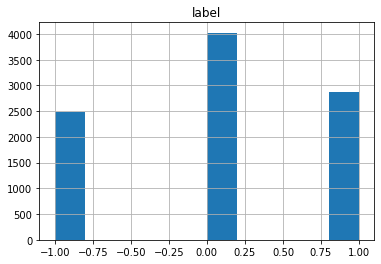

In [71]:
df[labels].hist()

In [72]:
r_w = 2
r_i = 2
df_to_backtest, model_n = cv(df,["2020-04-01","2023-12-31"], features, cat_features, labels,
                            retrain_window=224*r_w,
                            retrain_every=224*r_i,
                            min_train_window = 224*r_w,
                            verbose=True,
                            anchored=False,
                            val_slice_pct=None)#0.26)

Initiating cross validation: 2020-04-01 00:00:00 --> 2023-04-25 09:00:00


0it [00:00, ?it/s]

448 -->  TRAIN: 2020-04-01 00:00:00 -> 2020-05-26 21:00:00 (len: 448)


893it [00:10, 246.41it/s]

896 -->  TRAIN: 2020-05-27 00:00:00 -> 2020-07-21 21:00:00 (len: 448)


1321it [00:26, 156.77it/s]

1344 -->  TRAIN: 2020-07-22 00:00:00 -> 2020-09-15 21:00:00 (len: 448)


1786it [00:45, 182.18it/s]

1792 -->  TRAIN: 2020-09-16 00:00:00 -> 2020-11-10 21:00:00 (len: 448)


2212it [01:05, 187.70it/s]

2240 -->  TRAIN: 2020-11-11 00:00:00 -> 2021-01-05 21:00:00 (len: 448)


2661it [01:21, 180.07it/s]

2688 -->  TRAIN: 2021-01-06 00:00:00 -> 2021-03-02 21:00:00 (len: 448)


3123it [01:42, 170.14it/s]

3136 -->  TRAIN: 2021-03-03 00:00:00 -> 2021-04-27 21:00:00 (len: 448)


3577it [02:05, 186.70it/s]

3584 -->  TRAIN: 2021-04-28 00:00:00 -> 2021-06-22 21:00:00 (len: 448)


4029it [02:23, 207.20it/s]

4032 -->  TRAIN: 2021-06-23 00:00:00 -> 2021-08-17 21:00:00 (len: 448)


4477it [02:42, 243.40it/s]

4480 -->  TRAIN: 2021-08-18 00:00:00 -> 2021-10-12 21:00:00 (len: 448)


4907it [03:02, 195.89it/s]

4928 -->  TRAIN: 2021-10-13 00:00:00 -> 2021-12-07 21:00:00 (len: 448)


5359it [03:23, 174.88it/s]

5376 -->  TRAIN: 2021-12-08 00:00:00 -> 2022-02-01 21:00:00 (len: 448)


5798it [03:45, 167.21it/s]

5824 -->  TRAIN: 2022-02-02 00:00:00 -> 2022-03-29 21:00:00 (len: 448)


6256it [04:07, 188.92it/s]

6272 -->  TRAIN: 2022-03-30 00:00:00 -> 2022-05-24 21:00:00 (len: 448)


6690it [04:29, 216.52it/s]

6720 -->  TRAIN: 2022-05-25 00:00:00 -> 2022-07-19 21:00:00 (len: 448)


7138it [04:48, 176.12it/s]

7168 -->  TRAIN: 2022-07-20 00:00:00 -> 2022-09-13 21:00:00 (len: 448)


7600it [05:08, 185.15it/s]

7616 -->  TRAIN: 2022-09-14 00:00:00 -> 2022-11-08 21:00:00 (len: 448)


8037it [05:34, 145.01it/s]

8064 -->  TRAIN: 2022-11-09 00:00:00 -> 2023-01-03 21:00:00 (len: 448)


8499it [05:54, 172.71it/s]

8512 -->  TRAIN: 2023-01-04 00:00:00 -> 2023-02-28 21:00:00 (len: 448)


8956it [06:09, 24.21it/s] 


In [ ]:
# model.predict(x_oos)[0]

In [53]:
# model_n.save_model('model_pn_AUD') 

In [54]:
# from catboost import CatBoostClassifier
# model = CatBoostClassifier()
# model.load_model("model_pn")

In [55]:
# model

In [77]:

# ============================
# Backtest parameters
# ============================
long_equity = 5e5
long_notional=5e5
short_equity = 5e5
short_notional= 5e5

comment = ""
# fee = 0.0005
fee = 0.000
slippage = 0.0

min_holding_period = 0

hp = 24*7
max_holding_period = hp-3

position_sizing_to_trade="size"

if position_sizing_to_trade is not None:
    long_notional = long_notional/position_sizing_range[-1]
    short_notional = short_notional/position_sizing_range[-1]




signal_function="Y"
signals=["p_d","p_u","Y"]
# signal_function="pud"
figsize = (20,13) #(20,29) # width, height
# figsize = (20,30)
# window =["2020-11-02","2022-08-23"] # - 0th backtest
# window =["2022-01-01","2023-12-31"] 
window =["2021-01-01","2023-12-31"] 

tradable_times = [["00:05", "23:50"]]
closing_session_times= [["23:50", "00:00"]]

kline_to_trade = list(df_to_backtest.columns)[3]
volume_to_trade = list(df_to_backtest.columns)[4]



if hp > 1e5:
    hp_to_print= "-"
else:
    hp_to_print = hp

if position_sizing_to_trade is not None:
    sized = " sized"
else:
    sized=""
    
title = f"{timeframe} AUDUSD | fees: {fee*1e4} bps"
title = f"AUDUSD_{comment} HP{hp_to_print} WF{r_w}_{r_i}{sized}"
file_name = f"{timeframe} AUDUSD Model f {lookahead_window}_{threshold}_{comment} HP{hp_to_print} WF{r_w}_{r_i}{sized}"

In [1]:
57/3

19.0

tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|█████████████████████████████████████| 6756/6756 [00:00<00:00, 216852.13it/s]


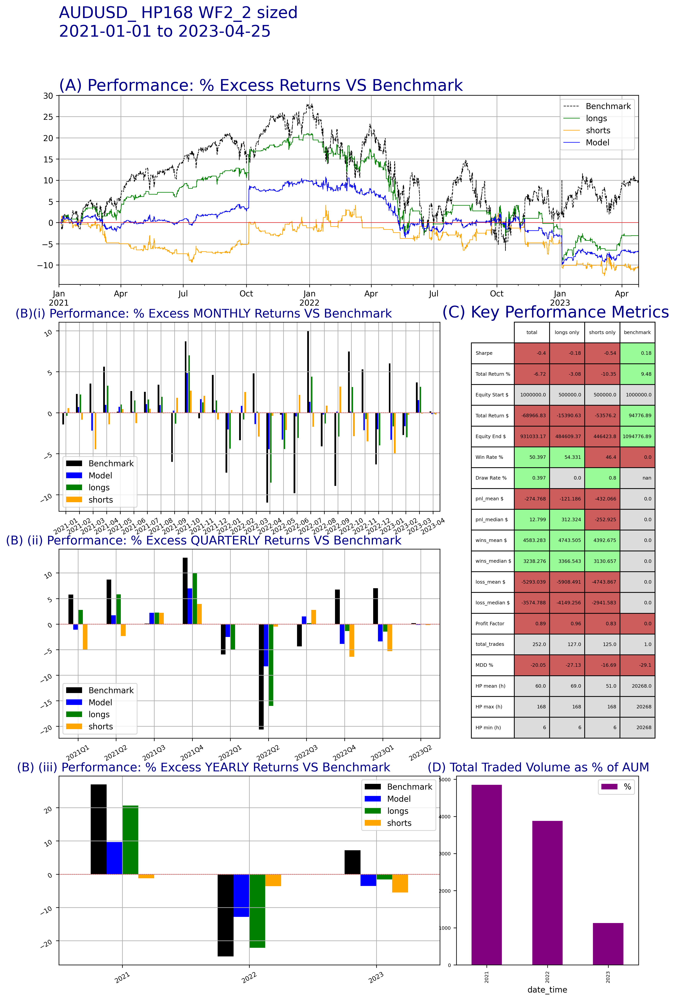

In [78]:
import importlib
from performance import metrics
importlib.reload(metrics)
from performance import backtest_plot
importlib.reload(backtest_plot)
from backtester import backtest
importlib.reload(backtest)
df_backtested,df_trades,df_summary = backtest.backtest(model_name= "Momentum",#"Mean_Reversion",
                                                       df0=df_to_backtest[window[0]:window[1]],
                                                       kline_to_trade=kline_to_trade,
                                                       volume_to_trade = volume_to_trade,
                                                       tradable_times = tradable_times,
                                                       closing_session_times = closing_session_times,
                                                       position_sizing_to_trade=position_sizing_to_trade,
                                                       min_holding_period=min_holding_period/int(timeframe[:-1]),
                                                       max_holding_period=max_holding_period/int(timeframe[:-1]),
                                                       fee=fee,
                                                       slippage=slippage,
                                                       long_equity = long_equity,
                                                       short_equity = short_equity,
                                                       long_notional=long_notional,
                                                       short_notional=short_notional,
                                                       horizon_labels=None,
                                                       signals=signals, 
                                                       signal_function=signal_function, 
                                                       figsize=figsize, # width, height
                                                       show_B=True,
                                                       show_LS=True,
                                                       title=title,
                                                       file_name=file_name,
                                                       plots="ppt",
                                                       diagnostics_verbose=False,
                                                       trail_SL = None,
                                                       trail_TP = None,
                                                       trail_increment = None,
                                                       N=365*8
                                                       )

# 3) RNN

## a) Load data

In [151]:
from config.load_config import load_config_file
from main import Trading_Bot

import importlib
importlib.reload(Trading_Bot)


# Load model name from config-dev
MODEL_NAME = load_config_file('./config/config-dev.json')['model_name']
# Load model config from given model name in config-dev.json
model_config = load_config_file(f'./config/{MODEL_NAME}.json')

# bot = Trading_Bot.Trading_Bot(model_config)    





In [152]:
from data_manager import klines_MR

klines_manager_mr = klines_MR.KlinesManagerMR(model_config)
instruments_dict = klines_manager_mr.load_and_update(limit_ccxt=1000, limit_TV=1000)

CCXT LOADING: ['ccxt_kucoin__BTC-USDT', 'ccxt_currencycom__US500']

Getting <<BTC-USDT>> from <<kucoin>> 
BTC-USDT (1h)
available till is outdated (2023-04-12 06:00:00)
--> in database (38367 rows): 2018-11-25 16:00:00 ===> 2023-04-12 06:00:00 (0.01s)
BTC-USDT fetched: 2023-03-01T16:00:00.000Z to 2023-04-12T07:00:00.000Z
---> 1000 | 2023-04-12T07:00:00.000Z to 2023-03-01T16:00:00.000Z
--> queried     (1000 rows): 2023-03-01 16:00:00 ===> 2023-04-12 07:00:00 (1.08s)
--> updated     (38368 rows): 2018-11-25 16:00:00 ===> 2023-04-12 07:00:00 (0.02s)

Getting <<US500>> from <<currencycom>> 
US500 (1h)
available till is outdated (2023-04-12 06:00:00)
--> in database (25727 rows): 2018-11-29 23:00:00 ===> 2023-04-12 06:00:00 (0.0s)
US500 fetched: 2023-03-01T16:00:00.000Z to 2023-04-12T07:00:00.000Z
---> 678 | 2023-04-12T07:00:00.000Z to 2023-03-01T16:00:00.000Z
--> queried     (678 rows): 2023-03-01 16:00:00 ===> 2023-04-12 07:00:00 (2.69s)
--> updated     (25728 rows): 2018-11-29 23:00:00 =

In [153]:
# Resample from 1hr --> 2h, 3h, 4h, 6h, 12h, 24h, 
from signals import resampler

resample_to_list = ["2h", "3h", "4h", "6h", "12h", "24h"]
first_timeframe = "1h"

# resample_to_list = ["15m", "20m", "30m", "60m"]
# first_timeframe = "5m"
for instrument,instrument_dict in instruments_dict.items():
    print(f"\n{instrument}\n")
    for resample_to in resample_to_list:
        df = instrument_dict[first_timeframe].copy()
        window = int(int(resample_to[:-1])/int(first_timeframe[:-1]))
        print(f"Resampling {first_timeframe} to {resample_to} --> window: {window}")
        if "m" in resample_to:
            resample_to_formatted = resample_to[:-1]+"T"
        else:
            resample_to_formatted = resample_to
        df_resampled = resampler.calc_klines_resample(df,window=window, resample_to=resample_to_formatted)
        # print(df_resampled.columns)
        instruments_dict[instrument][resample_to] = df_resampled
        
    



ccxt_kucoin__BTC-USDT

Resampling 1h to 2h --> window: 2
Resampling 1h to 3h --> window: 3
Resampling 1h to 4h --> window: 4
Resampling 1h to 6h --> window: 6
Resampling 1h to 12h --> window: 12
Resampling 1h to 24h --> window: 24

ccxt_currencycom__US500

Resampling 1h to 2h --> window: 2
Resampling 1h to 3h --> window: 3
Resampling 1h to 4h --> window: 4
Resampling 1h to 6h --> window: 6
Resampling 1h to 12h --> window: 12
Resampling 1h to 24h --> window: 24


## b) Calculate Signals

In [154]:
import importlib
from signals import signals
importlib.reload(signals)
from signals import composite_signals
importlib.reload(composite_signals)

from signals import signal_thresholds
target_signal = "sig_close_US500"
z_apply_to = ["open_US500","high_US500","low_US500","close_US500", "volume_US500"]    
# z_apply_to = ["open","high","low","close","volume", "open_US500","high_US500","low_US500","close_US500", "volume_US500"]    
    
df_sigs_dict={} 
if first_timeframe == "1h":
    lookback_bars_x = 288
elif first_timeframe == "5m":
    lookback_bars_x = 288*12*5
for timeframe in list(instruments_dict[list(instruments_dict.keys())[0]].keys())[2:3]:
# timeframe = "1h"

    # print(f"Populating signals for {timeframe} ...")
    
    lookback_bars = lookback_bars_x/int(timeframe[:-1])
    print(f"\n\n{'='*40}\nPopulating signals for {timeframe}\nlookack: {lookback_bars}\n{'='*40}")

    instruments = list(instruments_dict.keys())    
    futures_trading_times = []
    z_lookback_windows = [lookback_bars]*len(z_apply_to)

    factors_to_compose = [] 
    factors_to_normalise = [] 
    temp = {}
    
    sig_dict0 = signals.merge_instruments_dict(instruments_dict = instruments_dict, 
                                              spot_instrument = instruments[0],
                                              futures_instruments = instruments[1], 
                                              futures_trading_times = futures_trading_times, #["02:30:00","10:00:00"],
                                              verbose = False)

    sig_dict0 = signals.populate_z_signals(sig_dict0,
                                          lookback_windows = z_lookback_windows, 
                                          sig_threshold = 2,
                                          columns = z_apply_to,
                                           verbose = True,
                                         )

    # sig_dict0 = composite_signals.calc_rolling_composite_signal(sig_dict0, 
    #                                                            factors_to_compose = factors_to_compose,
    #                                                            factors_to_normalise = factors_to_normalise,
    #                                                            test_factor_loadings =  None,#[-0.02178511, 0.99976268],
    #                                                            rolling_start_date = rolling_start_date,
    #                                                            rolling_window_period = rolling_window_period, 
    #                                                            min_period = min_period,
    #                                                            verbose=True)

    # fit window: 2020-01-02 06:00:00 --> 2020-12-31 21:55:00 
    # ===> 
    # sig0 pcs: [-0.02178511, 0.99976268] 
    # VS 
    # sig  pcs:[-0.02158948, 0.99976692]

    from signals import composite_signals
    importlib.reload(composite_signals)


    normalize=False



    # sig_dict = signal_thresholds.calc_signal_thresholds(sig_dict0,
    #                                                     normalize = normalize,
    #                                                     target_signal = target_signal,
    #                                                     threshold_func = "qtl",
    #                                                     L_q_lookback = L_q_lookback,
    #                                                     L_q_lower = L_q_lower,
    #                                                     S_q_lookback = S_q_lookback,
    #                                                     S_q_upper = S_q_upper,
    #                                                     S_q_lower = S_q_lower
    #                                                    )

    
    from signals import composite_signals
    importlib.reload(composite_signals) 

    df_sig = composite_signals.merge_signals(sig_dict0, smallest_timeframe = timeframe, target_signal = target_signal)
    # print(df_sig.columns)
    # %matplotlib widget

    # Select eigen vector with suitable signs [- and + ] but does doesnt tally for 2020-2021 where 0.05, 0.99
    # df_sig.filter(regex="weight").plot()


    import importlib
    from signals import position_sizing
    importlib.reload(position_sizing)

    instrument_atr = ""
    position_sizing_range = (1,2)

    df_sig = position_sizing.calc_position_sizes(df_sig,
                                                    high = f"{timeframe}_high{instrument_atr}",
                                                    low = f"{timeframe}_low{instrument_atr}",
                                                    close = f"{timeframe}_close{instrument_atr}",
                                                    window_ATR = 14,
                                                    window_norm=14,
                                                   newRange=position_sizing_range)

    df_sig.index.name = "date_time"

    df_sigs_dict[timeframe] = df_sig



Populating signals for 3h
lookack: 96.0

---------------> 1h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score signal for high_US500 --> 96.0  
Calculating z-score signal for low_US500 --> 96.0  
Calculating z-score signal for close_US500 --> 96.0  
Calculating z-score signal for volume_US500 --> 96.0  

---------------> 2h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score signal for high_US500 --> 96.0  
Calculating z-score signal for low_US500 --> 96.0  
Calculating z-score signal for close_US500 --> 96.0  
Calculating z-score signal for volume_US500 --> 96.0  

---------------> 3h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score signal for high_US500 --> 96.0  
Calculating z-score signal for low_US500 --> 96.0  
Calculating z-score signal for close_US500 --> 96.0  
Calculating z-score signal for volume_US500 --> 96.0  

---------------> 4h
Calculating z-score signal for open_US500 --> 96.0  
Calculating z-score 

## c) Label

In [155]:
from labels import triple_barrier
import importlib
import numpy as np
importlib.reload(triple_barrier)

# df,labels_df = triple_barrier.calc_triple_barrier1(df_backtested, 
#                                                   col_series="5m_close", 
#                                                   col_timestamps="5m_close_time",
#                                                   horizon_delta = 5,
#                                                   upper_delta=0.001,
#                                                   lower_delta=-0.001, 
#                                                   labels=2)

# df = triple_barrier.calc_triple_barrier(df_backtested, 
#                                                   col_series="5m_close", 
#                                                   col_timestamps="5m_close_time",
#                                                   labels=3,
#                                                   fill_no_trades = False,
#                                                   horizon_delta = 5,
#                                                   vol_span = 144, 
#                                                   upper_z = 5, 
#                                                   lower_z = -5,
#                                                   upper_delta=0.01,
#                                                   lower_delta=-0.01)
# df[["label"]].hist()




def calc_labels(df0, 
                lookahead_window,
                threshold,
                labels=3,
                timeframe = "5m"):
    """ for each datetime, if next <<lookahead_window>> logreturns >0 then label is 1, else -1"""
    
    df = df0.copy()
    
    np_log_price = np.log(df[[f"{timeframe}_high", f"{timeframe}_low"]].mean(axis=1).values)
    np_close_time = df[f"{timeframe}_close_time"]
    # get midprice
    
    n = len(np_log_price)
    np_labels = np.full(n, np.nan)
    np_label_dates = np.full(n, np.nan)
    
    for i, t_seconds in enumerate(np_close_time):
        start_log_price = np_log_price[i]
        np_log_returns = np_log_price[i:i+lookahead_window] - start_log_price
        
        if labels == 2:
            if np_log_returns[-1] <threshold:
                label = -1
            else:
                label = 1
        elif labels == 3:
            if np_log_returns[-1] <-threshold:
                label = -1
            elif np_log_returns[-1] >threshold :
                label = 1
            else:
                label = 0
        np_labels[i] = label
    
    df["label"] = np_labels
    return df

###########################################
# Run labels
###########################################
timeframe = "3h"
number_of_labels=3
df = df_sigs_dict[timeframe].copy()
print(f"Columns before adding label: \n{df.columns}\n")
lookahead_window=19
threshold=0.025
df_labelled = calc_labels(df, labels=number_of_labels,lookahead_window=lookahead_window, threshold=threshold, timeframe=timeframe)

print(f"Columns after adding label: \n{df_labelled.columns}\n")

Columns before adding label: 
Index(['3h_open', '3h_high', '3h_low', '3h_close', '3h_volume',
       '3h_close_time', '3h_open_US500', '3h_high_US500', '3h_low_US500',
       '3h_close_US500', '3h_volume_US500', '3h_close_time_US500',
       '3h_spread_US500', '3h_z_open_US500', '3h_sig_open_US500',
       '3h_z_high_US500', '3h_sig_high_US500', '3h_z_low_US500',
       '3h_sig_low_US500', '3h_z_close_US500', '3h_sig_close_US500',
       '3h_z_volume_US500', '3h_sig_volume_US500', '1h_sig_close_US500',
       '2h_sig_close_US500', '4h_sig_close_US500', '6h_sig_close_US500',
       '12h_sig_close_US500', '24h_sig_close_US500', 'ATR', 'size'],
      dtype='object')

Columns after adding label: 
Index(['3h_open', '3h_high', '3h_low', '3h_close', '3h_volume',
       '3h_close_time', '3h_open_US500', '3h_high_US500', '3h_low_US500',
       '3h_close_US500', '3h_volume_US500', '3h_close_time_US500',
       '3h_spread_US500', '3h_z_open_US500', '3h_sig_open_US500',
       '3h_z_high_US500', '

## d) Data Windowing

FEATURES: ['3h_sig_open_US500', '3h_sig_high_US500', '3h_sig_low_US500', '3h_sig_close_US500', '3h_sig_volume_US500', '1h_sig_close_US500', '2h_sig_close_US500', '4h_sig_close_US500', '6h_sig_close_US500', '12h_sig_close_US500', '24h_sig_close_US500']
TOTAL window: 2018-12-01 00:00:00 ----> 2023-04-12 09:00:00, len: 12748
TRAIN window: 2020-10-01 00:00:00 ----> 2021-09-30 21:00:00, len: 2920
TOTAL TRAIN window: 2020-10-01 00:00:00 ----> 2021-12-31 21:00:00, len: 3656
VAL window: 2021-10-01 00:00:00 ----> 2021-12-31 21:00:00, len: 736
TEST window: 2022-01-01 00:00:00 ----> 2022-12-31 21:00:00, len: 2920
VAL/TRAIN: 0.2013129102844639

cat features:
['3h_sig_open_US500', '3h_sig_high_US500', '3h_sig_low_US500', '3h_sig_close_US500', '3h_sig_volume_US500', '1h_sig_close_US500', '2h_sig_close_US500', '4h_sig_close_US500', '6h_sig_close_US500', '12h_sig_close_US500', '24h_sig_close_US500']

labels:
['label']
features: 
['3h_sig_open_US500', '3h_sig_high_US500', '3h_sig_low_US500', '3h_sig_cl

array([<AxesSubplot:label='D', title={'center':'label'}>], dtype=object)

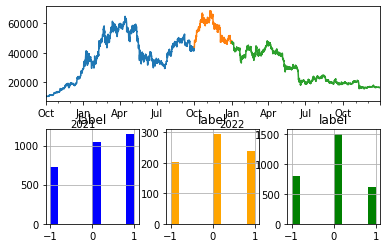

In [156]:


import numpy as np
train_window = ["2020-10-01",'2021-09-30']
val_window = ["2021-10-01",'2021-12-31']
test_window = ['2022-01-01','2022-12-31']

# train_window = ["2020-04-01",'2021-03-30']
# val_window = ["2022-04-01",'2022-09-30']
# test_window = ['2022-10-01','2022-12-31']


# df=df.filter(regex="(1h)|(label)")
# df.dropna(inplace=True)
# df= df.filter(regex="(1h)|(label)")
df = df_labelled.copy()
timeframe = list(df.columns)[0].split("_")[0]
features = list(df.filter(regex="sig"))
cat_features = features
print(f"FEATURES: {features}")
#  Ensure cat_features are int

df[cat_features] = df[cat_features].fillna(method="ffill")
df.dropna(subset=cat_features,inplace=True)
df[cat_features]=df[cat_features].astype(int)
labels = ['label'] 

df_train = df[train_window[0]:train_window[1]].copy()
df_train_full = df[train_window[0]:val_window[1]].copy()
df_val = df[val_window[0]:val_window[1]].copy()
df_test = df[test_window[0]:test_window[1]].copy()

print(f"TOTAL window: {df.index[0]} ----> {df.index[-1]}, len: {len(df)}")
print(f"TRAIN window: {df_train.index[0]} ----> {df_train.index[-1]}, len: {len(df_train)}")
print(f"TOTAL TRAIN window: {df_train_full.index[0]} ----> {df_train_full.index[-1]}, len: {len(df_train_full)}")
print(f"VAL window: {df_val.index[0]} ----> {df_val.index[-1]}, len: {len(df_val)}")
print(f"TEST window: {df_test.index[0]} ----> {df_test.index[-1]}, len: {len(df_test)}")
print(f"VAL/TRAIN: {len(df_val)/(len(df_val)+len(df_train))}")
print(f"\ncat features:\n{cat_features}")
print(f"\nlabels:\n{labels}\nfeatures: \n{features}")


# %matplotlib widget
import matplotlib.pyplot as plt
fig, axs = plt.subplot_mosaic("AAA;BCD")
df_train[f"{timeframe}_close"].plot(ax=axs["A"])
df_val[f"{timeframe}_close"].plot(ax=axs["A"])
df_test[f"{timeframe}_close"].plot(ax=axs["A"])
df_train[labels].hist(ax=axs["B"], color="blue")
df_val[labels].hist(ax=axs["C"],color="orange")
df_test[labels].hist(ax=axs["D"],color="green")
# df[test_window[1]:][labels].hist(ax=axs["D"],color="green")
# label_train = df_train[labels].value_counts()


# 

In [157]:
# Rescale the features
from sklearn.preprocessing import StandardScaler  # MinMaxScaler

# train_features = df_train[features]
# train_labels = df_train[labels]

# test_features = df_test[features]
# test_labels =  df_test[labels]

# scaler = StandardScaler()  # MinMaxScaler(feature_range=(-1,1))
# scaled_train_features = pd.DataFrame(scaler.fit_transform(train_features.values),
#                                      index=train_features.index,
#                                      columns=train_features.columns)
# # The Scaler is fit on the training set and then applied to the test set
# scaled_test_features = pd.DataFrame(scaler.transform(test_features.values),
#                                     index=test_features.index,
#                                     columns=test_features.columns)



x_train = df_train[features].values
x_val = df_val[features].values
x_test = df_test[features].values

y_train = df_train[labels].values
y_val = df_val[labels].values
y_test = df_test[labels].values

x_train = x_train.reshape((x_train.shape[0], x_train.shape[1], 1))
x_val = x_val.reshape((x_val.shape[0], x_val.shape[1], 1))
x_test = x_test.reshape((x_test.shape[0], x_test.shape[1], 1))
# Change to 2 labels

if number_of_labels >2:
    y_train = y_train +1
    y_val = y_val +1
    y_test = y_test+1
else:  
    y_train[y_train == -1] = 0
    y_val[y_val == -1] = 0
    y_test[y_test == -1] = 0

print(f"x_train shape: {x_train.shape}\ny_train shape: {y_train.shape}\n")
print(f"x_val shape: {x_val.shape}\ny_val shape: {y_val.shape}\n")
print(f"x_test_shape : {x_test.shape}\ny_test_shape : {y_test.shape}\n")
print(f"y_train labels: {np.unique(y_train)}\ny_val labels: {np.unique(y_val)}\ny_test labels: {np.unique(y_test)}")

x_train shape: (2920, 11, 1)
y_train shape: (2920, 1)

x_val shape: (736, 11, 1)
y_val shape: (736, 1)

x_test_shape : (2920, 11, 1)
y_test_shape : (2920, 1)

y_train labels: [0. 1. 2.]
y_val labels: [0. 1. 2.]
y_test labels: [0. 1. 2.]


## e) Build Model

In [158]:
from tensorflow import keras
from tensorflow.keras import layers

def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Normalization and Attention
    x = layers.LayerNormalization(epsilon=1e-6)(inputs)
    x = layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(x, x)
    x = layers.Dropout(dropout)(x)
    res = x + inputs

    # Feed Forward Part
    x = layers.LayerNormalization(epsilon=1e-6)(res)
    x = layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = layers.Dropout(dropout)(x)
    x = layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    return x + res

def build_model(
    number_of_labels,
    input_shape, # Number of features
    transformer_params,
    mlp_units,
    lstm_units=[10],
    dropout=0,
    mlp_dropout=0,
):
    
                    
    inputs = keras.Input(shape=input_shape)
    x = inputs
    
    # -------------
    # transformer layers
    # -------------
    num_transformer_blocks=transformer_params["num_transformer_blocks"]
    head_size=transformer_params["head_size"]
    num_heads=transformer_params["num_heads"]
    ff_dim=transformer_params["ff_dim"]
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    
    # -------------
    # LSTM
    # -------------
    # for dim in lstm_units: 
    #     x = layers.LSTM(dim, activation="tanh",recurrent_activation="sigmoid")(x)
    
    # -------------
    # dense layers
    # -------------
    for dim in mlp_units:
        x = layers.Dense(dim, activation="tanh")(x)
        # x = layers.Dropout(mlp_dropout)(x)
        
    
    
    
    outputs = layers.Dense(number_of_labels, activation="softmax")(x)
    return keras.Model(inputs, outputs)


##################################################################
# BUILD MODEL
##################################################################
transformer_params = {"num_transformer_blocks":0,
                      "num_heads":4,
                      "head_size":256,
                      "ff_dim":4,
                     }

mlp_units=[128]
mlp_dropout=0.2
dropout=0.25
epochs=1000
batch_size = 96

model = build_model(
                    number_of_labels=number_of_labels,
                    input_shape=x_train.shape[1:],
                    transformer_params = transformer_params,
                    mlp_units=mlp_units,
                    mlp_dropout=mlp_dropout,
                    dropout=dropout,
                    )

model.compile(
    loss="sparse_categorical_crossentropy",
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["sparse_categorical_accuracy"],
)
model.summary()

2023-04-12 15:07:43.907846: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 11, 1)]           0         
                                                                 
 global_average_pooling1d (G  (None, 11)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dense (Dense)               (None, 128)               1536      
                                                                 
 dense_1 (Dense)             (None, 3)                 387       
                                                                 
Total params: 1,923
Trainable params: 1,923
Non-trainable params: 0
_________________________________________________________________


2023-04-12 15:07:48.513066: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


### i) Run model

In [159]:
callbacks = [keras.callbacks.EarlyStopping(monitor="val_loss",patience=20, restore_best_weights=True)]
# callbacks = []

history = model.fit(
                    x_train,
                    y_train,
                    validation_data = (x_val, y_val),
                    epochs=epochs,
                    batch_size=batch_size, # Try for different batch sizes, past 64 hours good enough???
                    callbacks=callbacks,
                )

#  EVALUATE

# Evaluate the model:
train_loss, train_acc = model.evaluate(x_train, y_train, verbose=1)
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=1)




Epoch 1/1000
31/31 [==============================] - 1s 8ms/step - loss: 1.1709 - sparse_categorical_accuracy: 0.3264 - val_loss: 1.2161 - val_sparse_categorical_accuracy: 0.2772
Epoch 2/1000
31/31 [==============================] - 0s 3ms/step - loss: 1.1181 - sparse_categorical_accuracy: 0.3658 - val_loss: 1.1786 - val_sparse_categorical_accuracy: 0.3152
Epoch 3/1000
31/31 [==============================] - 0s 3ms/step - loss: 1.0954 - sparse_categorical_accuracy: 0.4127 - val_loss: 1.1606 - val_sparse_categorical_accuracy: 0.3397
Epoch 4/1000
31/31 [==============================] - 0s 3ms/step - loss: 1.0802 - sparse_categorical_accuracy: 0.4404 - val_loss: 1.1518 - val_sparse_categorical_accuracy: 0.3111
Epoch 5/1000
31/31 [==============================] - 0s 3ms/step - loss: 1.0696 - sparse_categorical_accuracy: 0.4332 - val_loss: 1.1443 - val_sparse_categorical_accuracy: 0.2976
Epoch 6/1000
31/31 [==============================] - 0s 3ms/step - loss: 1.0617 - sparse_categorica



-----------------------------------------------------------------
Model Performance
-----------------------------------------------------------------

train accuracy = 45.48%
test accuracy = 28.12%
test error = 2099 out of 2920 examples


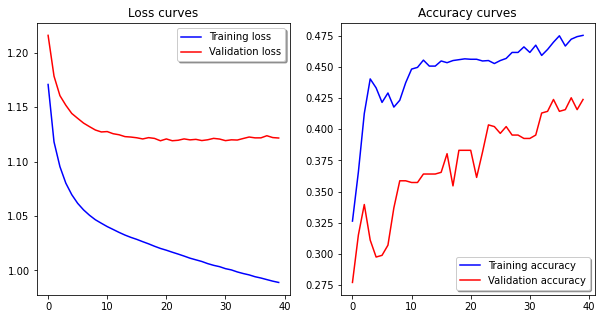

In [160]:
print(f"\n\n{'-'*65}\nModel Performance\n{'-'*65}\n")
print(f'train accuracy = {round(train_acc * 100, 2)}%')
print(f'test accuracy = {round(test_acc * 100, 2)}%')
print(f'test error = {round((1 - test_acc) * x_test.shape[0])} out of {x_test.shape[0]} examples')

# Plot the loss and accuracy curves over epochs:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
axs[0].plot(history.history['loss'], color='b', label='Training loss')
axs[0].plot(history.history['val_loss'], color='r', label='Validation loss')
axs[0].set_title("Loss curves")
axs[0].legend(loc='best', shadow=True)
axs[1].plot(history.history['sparse_categorical_accuracy'], color='b', label='Training accuracy')
axs[1].plot(history.history['val_sparse_categorical_accuracy'], color='r', label='Validation accuracy')
axs[1].set_title("Accuracy curves")
axs[1].legend(loc='best', shadow=True)
plt.show()

### ii) Model Performance

In [161]:



# pred = model.predict(x_test, verbose=1)
df_to_backtest = df[train_window[0]:].copy()
x_backtest = df_to_backtest[features].values
x_backtest = x_backtest.reshape((x_backtest.shape[0], x_backtest.shape[1], 1))

pred = model.predict(x_backtest)
if number_of_labels > 2:
    df_to_backtest["p_u"] = pred[:,2]
    df_to_backtest["p_s"] = pred[:,1]
    df_to_backtest["p_d"] = pred[:,0]
else:
    df_to_backtest["p_u"] = pred[:,1]
    df_to_backtest["p_d"] = pred[:,0]
    df_to_backtest["p"] = pred[:,1]

# df_to_backtest["Y"] = 




231/231 [==============================] - 0s 836us/step


## f) Backtest

In [169]:
# ============================
# Backtest parameters
# ============================
# fee = 0
fee = 0.0005
slippage = 0.0

min_holding_period = 0
max_holding_period = 1e6

long_equity = 5e5
long_notional=5e5
short_equity = 5e5
short_notional= 5e5

signal_function="pud"
figsize = (20,12) #(20,29) # width, height
# figsize = (20,30)
# window =["2020-11-02","2022-08-23"] # - 0th backtest
# window =[train_window[0],"2023-12-31"] 
window =["2021-01-01","2023-12-31"] 
# window = [train_window[0],val_window[1]]

signals = ["p_u","p_d"]
# signals = ["p"]

tradable_times = [["00:05", "23:50"]]
closing_session_times= [["23:50", "00:00"]]
kline_to_trade = list(df_to_backtest.columns)[3]
volume_to_trade = list(df_to_backtest.columns)[4]

title = f"{timeframe} BTC spot | fees: {fee*1e4} bps"
file_name = f"{timeframe} BTC Model"

tradable_times: [['00:05', '23:50']], closing_session_times: [['23:50', '00:00']]


100%|█████████████████████████████████████| 6652/6652 [00:01<00:00, 5770.12it/s]


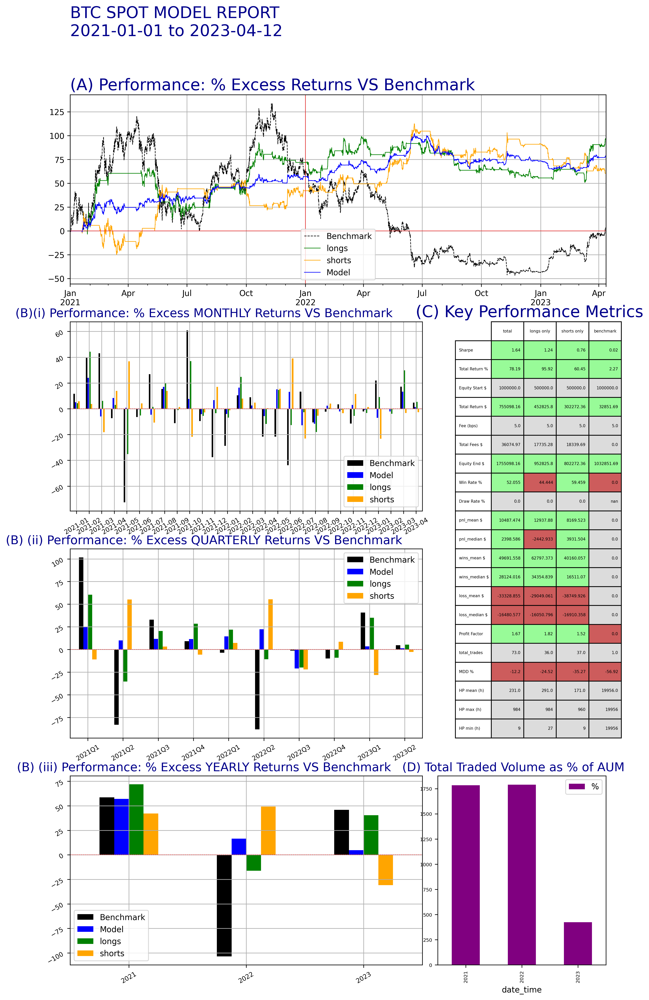

In [170]:
import importlib
from performance import metrics
importlib.reload(metrics)
from performance import backtest_plot
importlib.reload(backtest_plot)
from backtester import backtest
importlib.reload(backtest)
df_backtested,df_trades,df_summary = backtest.backtest(model_name= "Momentum",#"Mean_Reversion",
                                                       df0=df_to_backtest[window[0]:window[1]],
                                                       kline_to_trade=kline_to_trade,
                                                       volume_to_trade = volume_to_trade,
                                                       tradable_times = tradable_times,
                                                       closing_session_times = closing_session_times,
                                                       position_sizing_to_trade=None,
                                                       min_holding_period=min_holding_period/int(timeframe[:-1]),
                                                       max_holding_period=max_holding_period/int(timeframe[:-1]),
                                                       fee=fee,
                                                       slippage=slippage,
                                                       long_equity = long_equity,
                                                       short_equity = short_equity,
                                                       long_notional=long_notional,
                                                       short_notional=short_notional,
                                                       horizon_labels=test_window[0],
                                                       signals=signals, 
                                                       signal_function=signal_function, 
                                                       figsize=figsize, # width, height
                                                       show_B=True,
                                                       show_LS=True,
                                                       title=title,
                                                       file_name="BTC OST rnn",
                                                       plots="ppt",
                                                       diagnostics_verbose=False,
                                                       trail_SL = None,
                                                       trail_TP = None,
                                                       trail_increment = None,
                                                       )

### iii) Plotly

CONVERTING TIMEZONE: UTC ----> Asia/Singapore
initially: 2023-03-29 09:00:00
now: 2023-03-29 17:00:00+08:00
now: 2023-03-29 17:00:00
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl']
plotting: ['cum_A_pnl', 'cum_S_pnl', 'cum_L_pnl'] --> LIST DETECTED
cum_A_pnl -> line plot
cum_S_pnl -> line plot
cum_L_pnl -> line plot
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}]
plotting: [{'instrument': 'US500', 'open': '3h_open_US500', 'high': '3h_high_US500', 'low': '3h_low_US500', 'close': '3h_close_US500', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 1}] --> LIST DETECTED
yaxis:  y   2
plotting: [{'instrument': 'BTC-USDT', 'open': '3h_open', 'high': '3h_high', 'low': '3h_low', 'close': '3h_close', 'up_color': 'rgb(14,203,129)', 'down_color': 'rgb(233,67,89)', 'opacity': 0.25}, 'L_entry_price', 'L_exit_pr

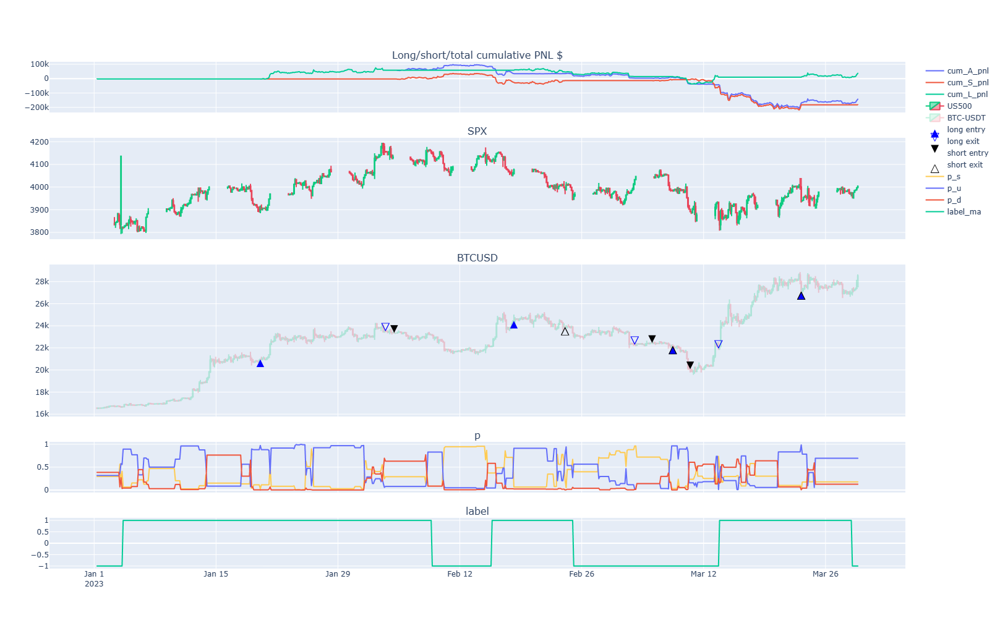

In [399]:

import importlib
from performance import plotly_studies
importlib.reload(plotly_studies)


# window = ["2022-01-01","2022-12-31"] 
window = ["2023-01-01","2023-12-31"]

timeframe = "3h"

ohlc = {"instrument":instruments[0].split("__")[1],
        "open":f"{timeframe}_open",
        "high":f"{timeframe}_high",
        "low":f"{timeframe}_low",
        "close":f"{timeframe}_close",
        "up_color":'rgb(14,203,129)',
        "down_color":'rgb(233,67,89)',
        "opacity":0.25}


symbol_factor = instruments[1].split("__")[-1]
ohlc_factor = {"instrument": symbol_factor,
                "open":f"{timeframe}_open_{symbol_factor}",
                "high":f"{timeframe}_high_{symbol_factor}",
                "low":f"{timeframe}_low_{symbol_factor}",
                "close":f"{timeframe}_close_{symbol_factor}",
                "up_color":'rgb(14,203,129)',
                "down_color":'rgb(233,67,89)',
                "opacity":1}


cols_to_plot = [["cum_A_pnl", "cum_S_pnl","cum_L_pnl"],
                [ohlc_factor],
                [ohlc,'L_entry_price','L_exit_price','S_entry_price','S_exit_price',],
                ["p_s","p_u","p_d"],["label_ma"]
                ]


subplot_titles = ["Long/short/total cumulative PNL $",f"SPX",f"BTCUSD", "p", "label"]
# subplot_titles = ["Long/short/total cumulative PNL $", f"{instruments[0]}", "signal", 'size']#"ES1!"]
row_heights = [1,2,3,1,1]
ps = plotly_studies.build(cols_to_plot = cols_to_plot,
                          row_heights = row_heights,
                          height=1000,
                          width=1500,
                         resampler=False, 
                         publish=True,
                         output_path= "./telegram/",
                         output_name = "BTC model pud",
                         subplot_titles = subplot_titles,
                         verbose=True)
ps.plot(df_backtested[window[0]:window[1]])